# CLUSTERING CLIENTS E_COMMERCE

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
conda list python

# packages in environment at C:\Users\Armand\anaconda3:
Note: you may need to restart the kernel to use updated packages.

#
# Name                    Version                   Build  Channel
ipython                   7.31.1           py39haa95532_1  
ipython_genutils          0.2.0              pyhd3eb1b0_1  
msgpack-python            1.0.3            py39h59b6b97_0  
python                    3.9.13               h6244533_1  
python-dateutil           2.8.2              pyhd3eb1b0_0  
python-fastjsonschema     2.16.2           py39haa95532_0  
python-libarchive-c       2.9                pyhd3eb1b0_1  
python-lsp-black          1.0.0              pyhd3eb1b0_0  
python-lsp-jsonrpc        1.0.0              pyhd3eb1b0_0  
python-lsp-server         1.3.3              pyhd3eb1b0_0  
python-slugify            5.0.2              pyhd3eb1b0_0  
python-snappy             0.6.0            py39hd77b12b_3  
python_abi                3.9                      2_cp39    conda-forge


In [3]:
conda list pandas

# packages in environment at C:\Users\Armand\anaconda3:
#
# Name                    Version                   Build  Channel
pandas                    1.4.4            py39hd77b12b_0  

Note: you may need to restart the kernel to use updated packages.


In [4]:
conda list numpy

# packages in environment at C:\Users\Armand\anaconda3:
#
# Name                    Version                   Build  Channel
numpy                     1.21.5           py39h7a0a035_3  
numpy-base                1.21.5           py39hca35cd5_3  
numpydoc                  1.4.0            py39haa95532_0  

Note: you may need to restart the kernel to use updated packages.


In [5]:
conda list seaborn

# packages in environment at C:\Users\Armand\anaconda3:
#
# Name                    Version                   Build  Channel
seaborn                   0.11.2             pyhd3eb1b0_0  

Note: you may need to restart the kernel to use updated packages.


In [6]:
conda list matplotlib

# packages in environment at C:\Users\Armand\anaconda3:
#
# Name                    Version                   Build  Channel
matplotlib                3.5.2            py39haa95532_0  
matplotlib-base           3.5.2            py39hd77b12b_0  
matplotlib-inline         0.1.6            py39haa95532_0  

Note: you may need to restart the kernel to use updated packages.


In [3]:
# on agrandit la fenretre de lecture
pd.set_option("display.max_rows", 250)
pd.set_option("display.max_columns", 250)
pd.set_option("display.max_colwidth", 50)

# I) Importation dataset

In [4]:
df = pd.read_csv("data_clean_cluster.csv")

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91472 entries, 0 to 91471
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Nb_cmde                       91472 non-null  int64  
 1   payment_value_sum             91472 non-null  float64
 2   review_score_1_sum            91472 non-null  float64
 3   review_score_2_sum            91472 non-null  float64
 4   review_score_3_sum            91472 non-null  float64
 5   review_score_4_sum            91472 non-null  float64
 6   review_score_5_sum            91472 non-null  float64
 7   payment_type_boleto_sum       91472 non-null  float64
 8   payment_type_credit_card_sum  91472 non-null  float64
 9   payment_type_debit_card_sum   91472 non-null  float64
 10  payment_type_voucher_sum      91472 non-null  float64
 11  Time_last_cmde_H              91472 non-null  float64
 12  Time_Answer_Review_H          91472 non-null  float64
 13  D

In [6]:
df.head()

,Nb_cmde,payment_value_sum,review_score_1_sum,review_score_2_sum,review_score_3_sum,review_score_4_sum,review_score_5_sum,payment_type_boleto_sum,payment_type_credit_card_sum,payment_type_debit_card_sum,payment_type_voucher_sum,Time_last_cmde_H,Time_Answer_Review_H,Delay_H_mean,product_weight_g_mean,Volume_Colis_cm3_mean
0,1,141.90,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,47592.898990,109.746667,99.189722,1500.0,7616.0
1,1,27.19,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,47664.648990,22.490278,101.955000,375.0,5148.0
2,1,86.22,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,57806.755657,25.328889,33.353611,1500.0,43750.0
3,1,43.62,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,52623.345101,24.297500,266.615278,150.0,1045.0
4,1,196.89,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,51832.078157,118.493056,168.851111,6050.0,528.0


# II) Featuring

## II.1) Normalisation

In [7]:
from sklearn.preprocessing import StandardScaler

In [8]:
# Normalisation 
scaler = StandardScaler()
df = pd.DataFrame(scaler.fit_transform(df), columns = df.columns)
df 

,Nb_cmde,payment_value_sum,review_score_1_sum,review_score_2_sum,review_score_3_sum,review_score_4_sum,review_score_5_sum,payment_type_boleto_sum,payment_type_credit_card_sum,payment_type_debit_card_sum,payment_type_voucher_sum,Time_last_cmde_H,Time_Answer_Review_H,Delay_H_mean,product_weight_g_mean,Volume_Colis_cm3_mean
0,-0.281337,-0.111536,-0.257032,-0.147807,-0.256476,-0.417580,0.343410,-0.415865,0.117142,-0.114777,-0.116446,-0.822305,0.144280,-0.701363,-0.162127,-0.327710
1,-0.281337,-0.293245,-0.257032,-0.147807,-0.256476,1.333285,-0.850024,-0.415865,0.117142,-0.114777,-0.116446,-0.802712,-0.226102,-0.689924,-0.463769,-0.434423
2,-0.281337,-0.199737,-0.257032,-0.147807,2.204489,-0.417580,-0.850024,-0.415865,0.117142,-0.114777,-0.116446,1.966851,-0.214053,-0.973708,-0.162127,1.234687
3,-0.281337,-0.267219,-0.257032,-0.147807,-0.256476,1.333285,-0.850024,-0.415865,0.117142,-0.114777,-0.116446,0.551388,-0.218431,-0.008773,-0.524097,-0.611833
4,-0.281337,-0.024427,-0.257032,-0.147807,-0.256476,-0.417580,0.343410,-0.415865,0.117142,-0.114777,-0.116446,0.335312,0.181406,-0.413194,1.057846,-0.634187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91467,0.903001,6.213585,-0.257032,-0.147807,-0.256476,-0.417580,1.536843,-0.415865,1.465991,-0.114777,-0.116446,1.377028,0.134042,1.530158,7.479462,10.222987
91468,-0.281337,-0.202335,-0.257032,-0.147807,-0.256476,1.333285,-0.850024,-0.415865,0.117142,-0.114777,-0.116446,0.164812,0.238173,-0.906800,-0.103140,0.729915
91469,-0.281337,-0.158171,-0.257032,-0.147807,-0.256476,-0.417580,0.343410,-0.415865,0.117142,-0.114777,-0.116446,2.171457,-0.053911,1.814000,-0.403441,-0.513680
91470,-0.281337,-0.124541,-0.257032,-0.147807,-0.256476,-0.417580,0.343410,-0.415865,0.117142,-0.114777,-0.116446,-0.771063,-0.052993,0.228995,-0.445268,-0.463307


## II.2) KMEANS

### II.2.1) Sans PCA

#### II.2.1.1) Approche avec toutes les variables

In [9]:
# importation KMeans
from sklearn.cluster import KMeans

In [10]:
# Séléction de toutes les colonnes
X = df[['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean']].values

In [1357]:
inertia = []
for i in np.arange(1,20) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

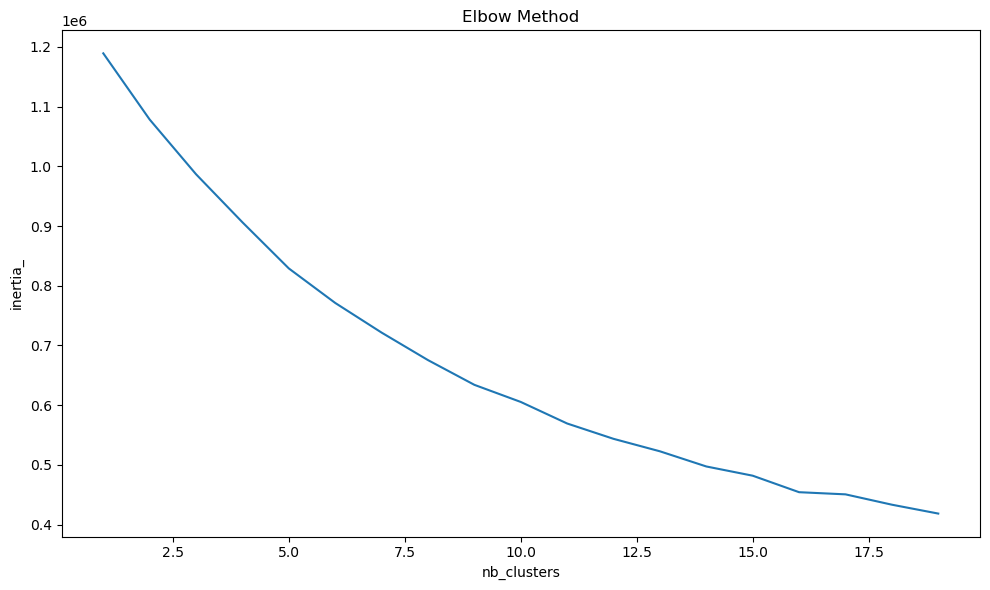

In [800]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,20),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [1358]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [312]:
# Coefficient de silhouette

nb_cluster = [5,6,7,8,9,10]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [319]:
# dico
dico_sil

{5: 0.2810771759084816,
 6: 0.2848596384289942,
 7: 0.2989840065250081,
 8: 0.21591448969230168,
 9: 0.2113373193213956,
 10: 0.22345237405783777}

In [320]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,5,6,7,8,9,10
coeff_silhouette,0.281077,0.28486,0.298984,0.215914,0.211337,0.223452


In [11]:
# 7 clusters retenus
kmeans_global = KMeans(n_clusters = 7, random_state=0, n_init = 10)
kmeans_global.fit_predict(X)

array([0, 0, 0, ..., 0, 0, 0])

In [12]:
# Centroides
centroides_kmeans_global = kmeans_global.cluster_centers_
centroides_kmeans_global

array([[-1.53520562e-01, -9.26488424e-02, -1.13373469e-01,
        -1.47806784e-01, -4.15495732e-01,  1.96690317e-01,
        -1.14777348e-01, -3.02469163e-02, -1.72380451e-02,
        -3.86645790e-02,  3.23050126e-02, -2.14186059e-01,
        -2.00482707e-01],
       [ 2.80411925e+00,  1.19960378e+00,  2.22104263e+00,
        -1.29261192e-01, -1.75284409e-01,  2.54237079e+00,
        -1.14777348e-01,  1.06491362e+00, -2.00260897e-02,
        -4.04155160e-02,  3.26818548e-02, -1.05546663e-01,
        -7.69495610e-02],
       [-1.30772473e-01,  3.53388650e-01, -9.66091681e-03,
        -7.66362908e-02, -1.02003653e-01, -7.69253104e-03,
        -1.09370716e-01, -5.08485444e-02,  1.01539489e-01,
        -2.74756119e-02, -5.00125485e-02,  2.92197259e+00,
         2.73271972e+00],
       [-8.03486587e-02, -6.53534011e-02, -6.98630138e-02,
        -1.94156200e-02, -3.86802505e-01, -1.20522139e+00,
         7.21594062e+00, -1.15206060e-01, -4.61866617e-01,
        -4.63465052e-02, -2.45880942e

#### II.2.1.) Approche avec séléction de 3 variables

In [13]:
# SélEction des colonnes pertinentes (Nb cmde, Montant, Récense)
X = df[['Nb_cmde', 'payment_value_sum', 'Time_last_cmde_H']]

In [280]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

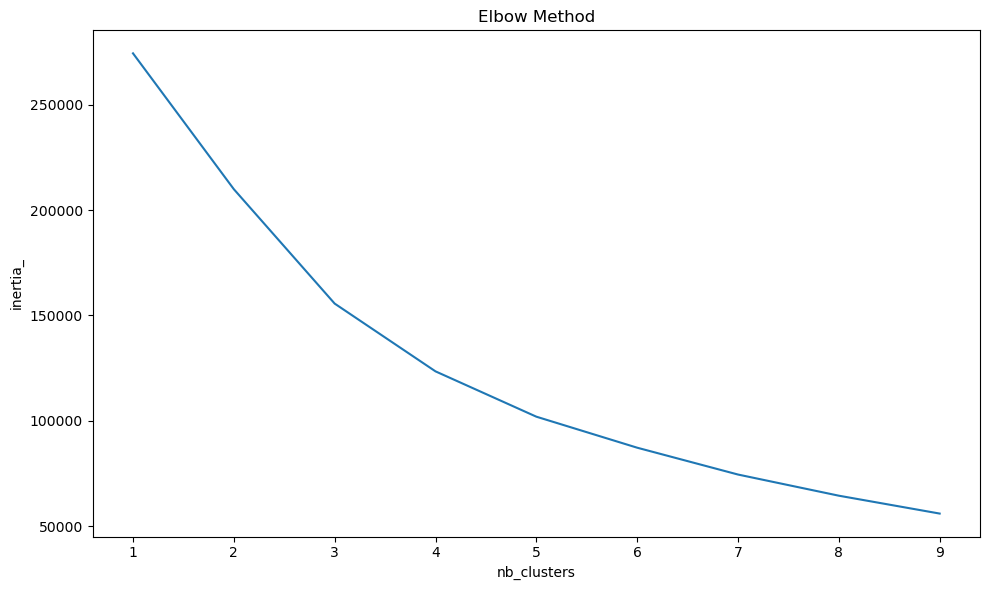

In [327]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [1499]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [328]:
# Coefficient de silhouette

nb_cluster = [3,4,5,6]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [329]:
# dico
dico_sil

{3: 0.4694378644714444,
 4: 0.47876928053868045,
 5: 0.482517329225328,
 6: 0.41568111575204675}

In [330]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,3,4,5,6
coeff_silhouette,0.469438,0.478769,0.482517,0.415681


In [14]:
# 5 clusters retenus
kmeans_Ncmde_payS_lastT = KMeans(n_clusters = 5, random_state=0, n_init = 10)
clusters_kmeans_Ncmde_payS_lastT = kmeans_Ncmde_payS_lastT.fit_predict(X)

In [15]:
df["ncmde_pays_lastt"] = clusters_kmeans_Ncmde_payS_lastT

In [16]:
# Centroides
centroides_kmeans_Ncmde_payS_lastT = kmeans_Ncmde_payS_lastT.cluster_centers_
centroides_kmeans_Ncmde_payS_lastT

array([[-1.48748180e-01, -6.85961768e-02, -7.21164953e-01],
       [ 3.09092994e+00,  1.14274684e+00, -1.87525005e-02],
       [-1.43513269e-01, -6.85592169e-02,  9.80711698e-01],
       [ 1.16583378e+01,  1.31974095e+01, -7.60641853e-02],
       [ 8.00903387e+00,  1.72823227e+02,  6.37974694e-01]])

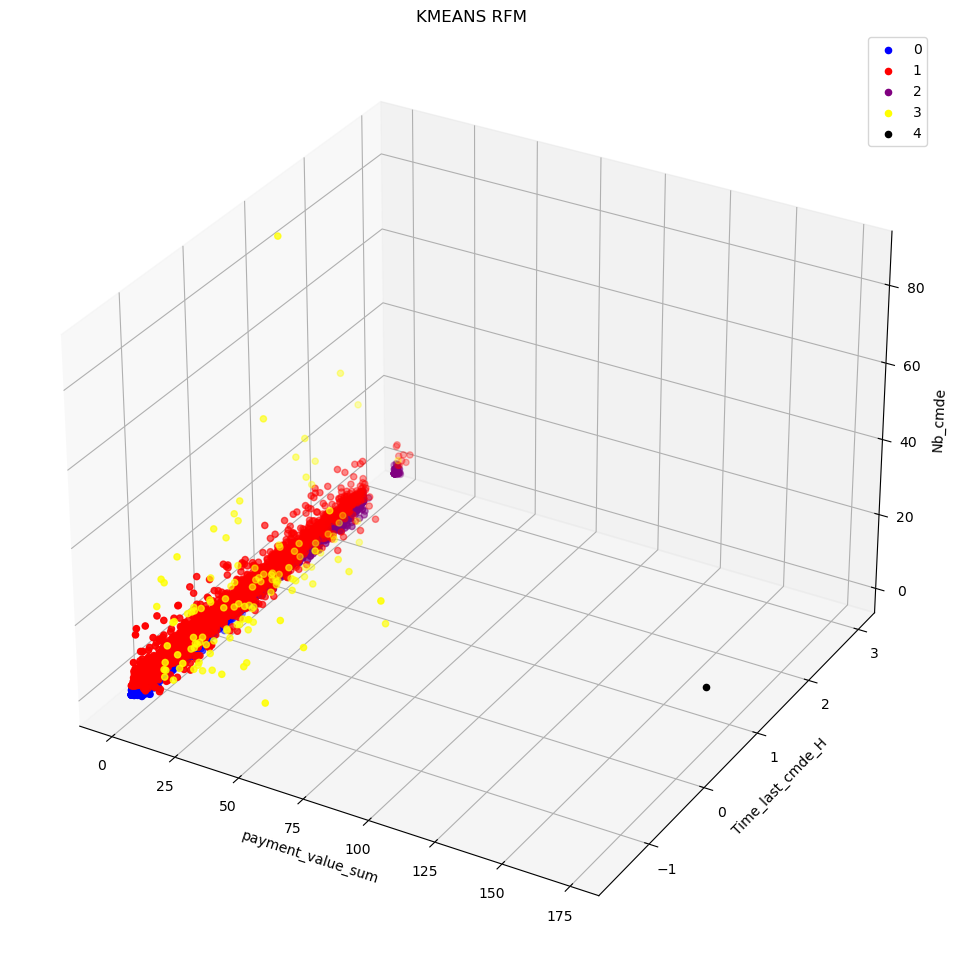

In [17]:

# Nuage de points 

plt.rcParams["figure.figsize"] = [12,12]
ax = plt.axes(projection = "3d")
cluster_list = [0,1,2,3,4]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_pays_lastt"]== k]
    ax.scatter3D(xs = df_filter["payment_value_sum"], ys = df_filter["Time_last_cmde_H"], zs = df_filter["Nb_cmde"], color = color, label = k)
plt.legend()
plt.title("KMEANS RFM")
plt.xlabel("payment_value_sum")
plt.ylabel("Time_last_cmde_H")
ax.set_zlabel("Nb_cmde")
plt.show()

#### II.2.1.2) Approche avec séléction de 2 variables

#####  'Nb_cmde', 'Time_last_cmde_H'

In [18]:
# SélEction des colonnes pertinentes (Fréquence, Récense)
X = df[['Nb_cmde', 'Time_last_cmde_H']]

In [379]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

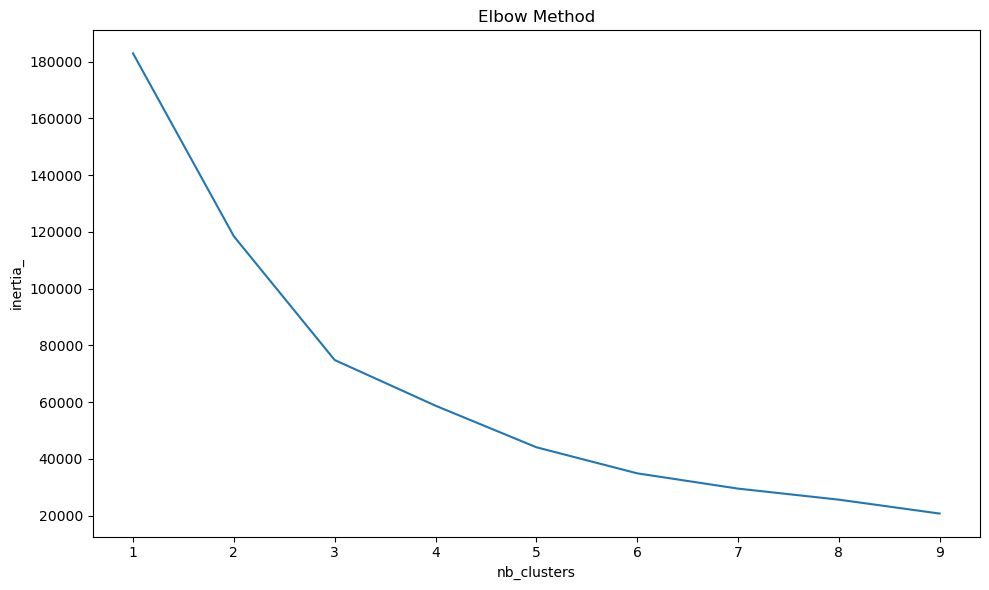

In [380]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [381]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [382]:
# Coefficient de silhouette

nb_cluster = [3,4,5,]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [383]:
# dico
dico_sil

{3: 0.5231831688950628, 4: 0.5284877927642624, 5: 0.4790920693749638}

In [384]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,3,4,5
coeff_silhouette,0.523183,0.528488,0.479092


In [19]:
# 4 clusters retenus
kmeans_Ncmde_lastT = KMeans(n_clusters = 4, random_state=0, n_init = 10)
clusters_kmeans_Ncmde_lastT = kmeans_Ncmde_lastT.fit_predict(X)

In [20]:
df["ncmde_lastt"] = clusters_kmeans_Ncmde_lastT

In [21]:
# Centroides
centroides_kmeans_Ncmde_lastT = kmeans_Ncmde_lastT.cluster_centers_
centroides_kmeans_Ncmde_lastT

array([[-1.47019179e-01, -7.17720010e-01],
       [ 2.99034809e+00, -4.07927827e-03],
       [-1.44382656e-01,  9.83991725e-01],
       [ 1.28208330e+01,  1.21999732e-01]])

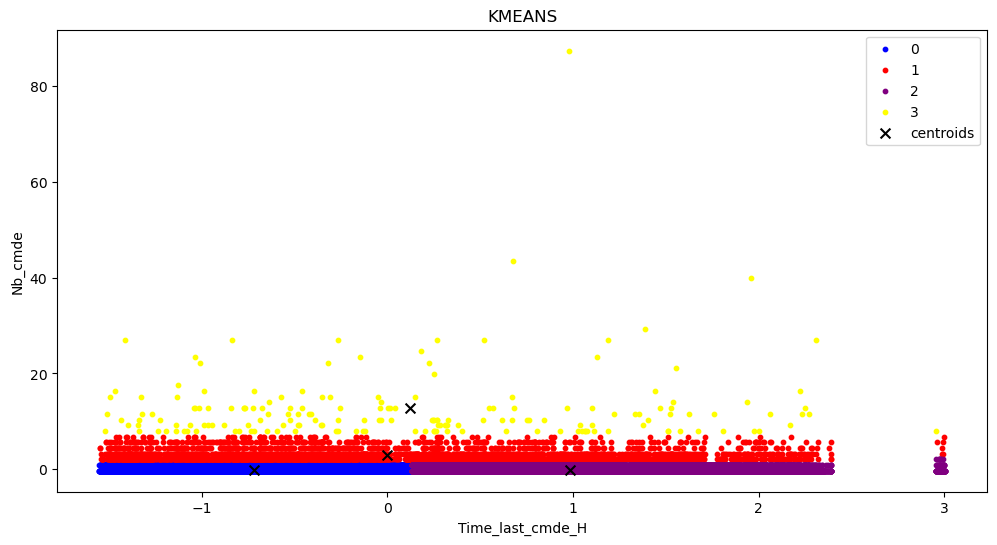

In [22]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2,3]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_lastt"]== k]
    plt.scatter(x = df_filter["Time_last_cmde_H"], y = df_filter["Nb_cmde"], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_Ncmde_lastT[:,1], y = centroides_kmeans_Ncmde_lastT[:,0], color = "black", label = "centroids", 
            s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("Time_last_cmde_H")
plt.ylabel("Nb_cmde")
plt.show()

##### 'Nb_cmde', payment_value_sum'

In [23]:
# SélEction des colonnes pertinentes (Fréquence, Montant)
X = df[['Nb_cmde', 'payment_value_sum']]

In [404]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

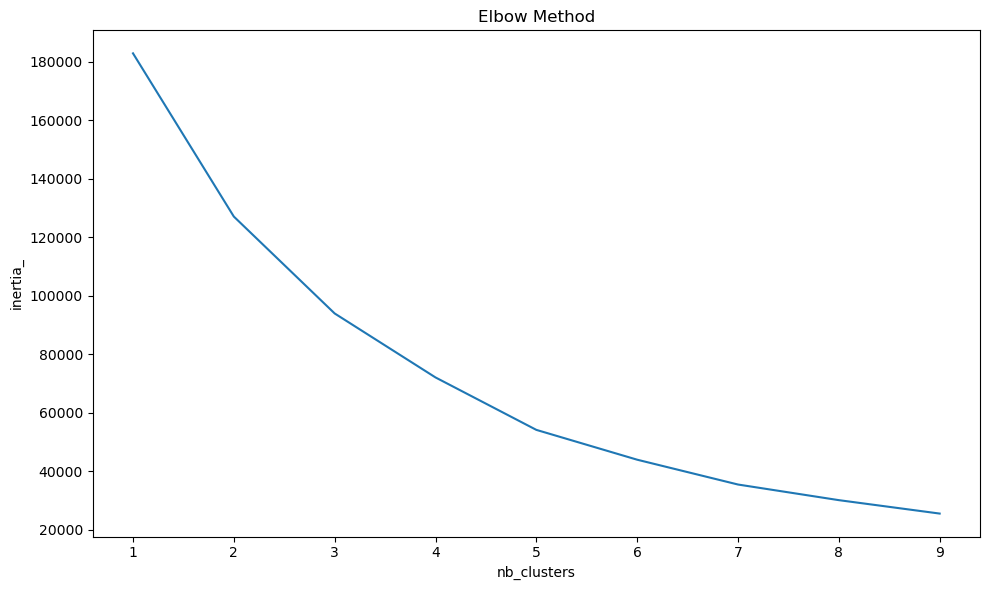

In [405]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [381]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [406]:
# Coefficient de silhouette

nb_cluster = [3,4,5,6]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [407]:
# dico
dico_sil

{3: 0.8536834948566309,
 4: 0.8485868062170947,
 5: 0.8029642916603046,
 6: 0.803789269035281}

In [408]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,3,4,5,6
coeff_silhouette,0.853683,0.848587,0.802964,0.803789


In [24]:
# 3 clusters retenus
kmeans_Ncmde_payS = KMeans(n_clusters = 3, random_state=0, n_init = 10)
clusters_kmeans_Ncmde_payS = kmeans_Ncmde_payS.fit_predict(X)

In [25]:
df["ncmde_pays"] = clusters_kmeans_Ncmde_payS

In [26]:
# Centroides
centroides_kmeans_Ncmde_payS = kmeans_Ncmde_payS.cluster_centers_
centroides_kmeans_Ncmde_payS

array([[-0.14772838, -0.06903643],
       [ 3.27506707,  1.35202157],
       [15.86873652, 38.6097183 ]])

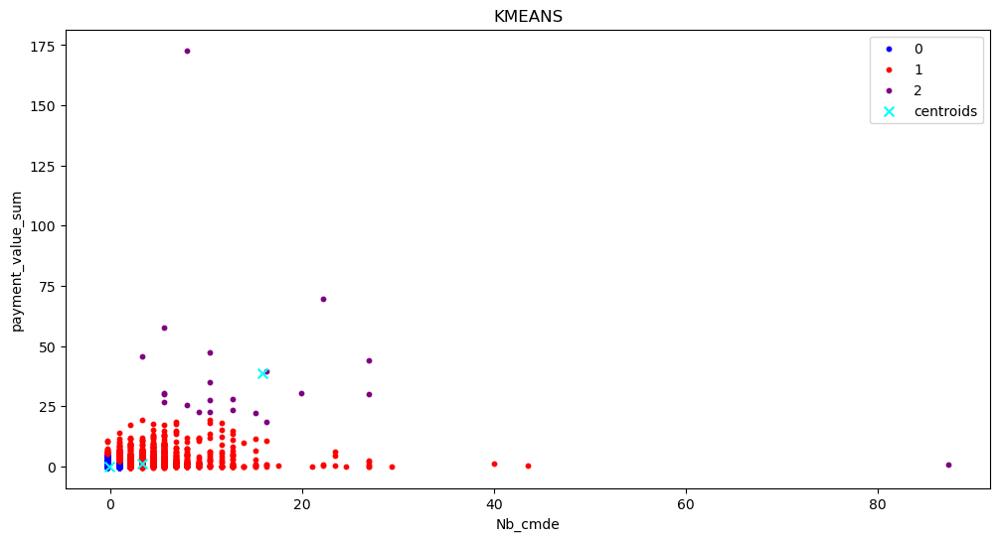

In [27]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_pays"]== k]
    plt.scatter(x = df_filter["Nb_cmde"], y = df_filter['payment_value_sum'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_Ncmde_payS[:,0], y = centroides_kmeans_Ncmde_payS[:,1], color = "cyan", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("Nb_cmde")
plt.ylabel("payment_value_sum")
plt.show()

MODELISATION ==> 'Nb_cmde', 'payment_value_sum' :

coeff_silhouette ==> 0.853683

Cluster violet ==> Très bon Clients (Champions)

Cluster rouge ==> Bon Clients

Cluster Bleu ==> Clients récents avec peu de cmde

#####  'payment_value_sum', 'Time_last_cmde_H'

In [28]:
# SélEction des colonnes pertinentes (payment_value_sum, Récense)
X = df[['payment_value_sum', 'Time_last_cmde_H']]

In [485]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

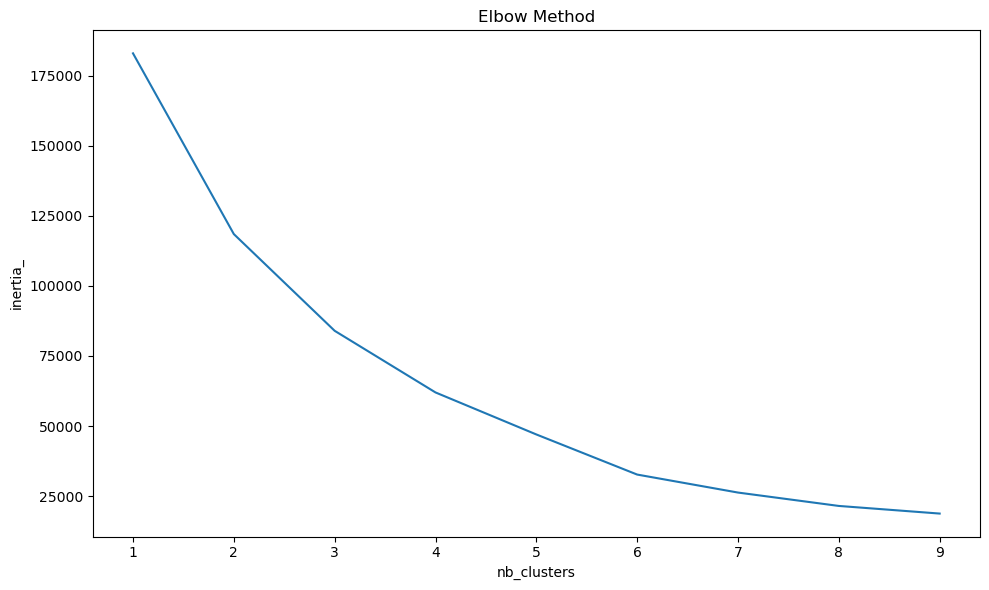

In [486]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [381]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [487]:
# Coefficient de silhouette

nb_cluster = [2,3,4,5,6]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [488]:
# dico
dico_sil

{2: 0.5193756669967527,
 3: 0.522350038340755,
 4: 0.5267223088582919,
 5: 0.46980355385945977,
 6: 0.48723409554441427}

In [489]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,2,3,4,5,6
coeff_silhouette,0.519376,0.52235,0.526722,0.469804,0.487234


In [29]:
# 4 clusters retenus
kmeans_Ncmde_lastT = KMeans(n_clusters = 4, random_state=0, n_init = 10)
clusters_kmeans_Ncmde_lastT = kmeans_Ncmde_lastT.fit_predict(X)

In [30]:
df["ncmde_lastT"] = clusters_kmeans_Ncmde_lastT

In [31]:
# Centroides
centroides_kmeans_Ncmde_lastT = kmeans_Ncmde_lastT.cluster_centers_
centroides_kmeans_Ncmde_lastT 

array([[-2.13669845e-02, -7.20986432e-01],
       [-2.40483317e-02,  9.77630037e-01],
       [ 1.41560571e+01, -4.46390924e-02],
       [ 1.72823227e+02,  6.37974694e-01]])

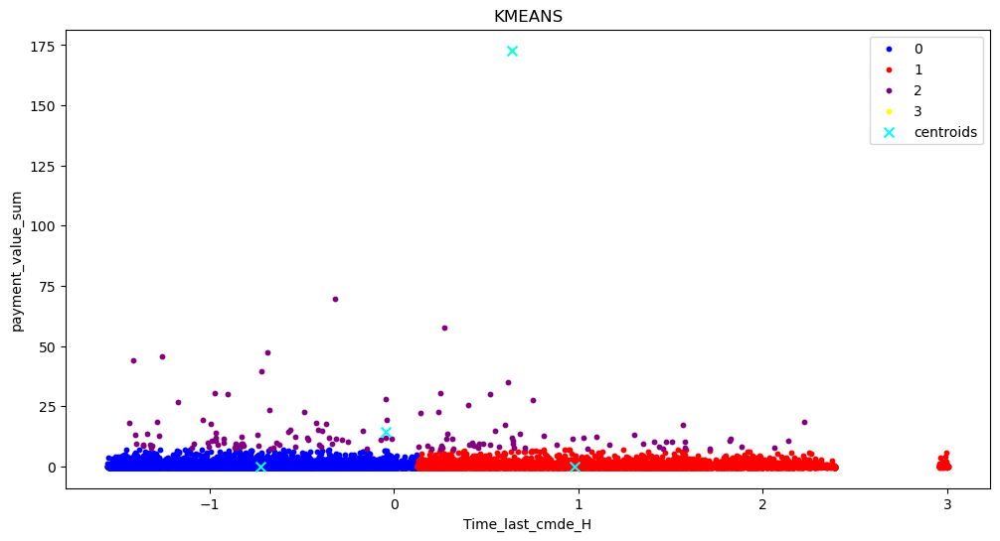

In [32]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2,3]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_lastT"]== k]
    plt.scatter(x = df_filter['Time_last_cmde_H'], y = df_filter['payment_value_sum'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_Ncmde_lastT[:,1], y = centroides_kmeans_Ncmde_lastT[:,0], color = "cyan", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("Time_last_cmde_H")
plt.ylabel('payment_value_sum')
plt.show()

##### 'Nb_cmde', review_score_1_sum'

In [33]:
# SélEction des colonnes pertinentes (Fréquence, Non satisfaction)
X = df[['Nb_cmde', 'review_score_1_sum']]

In [824]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

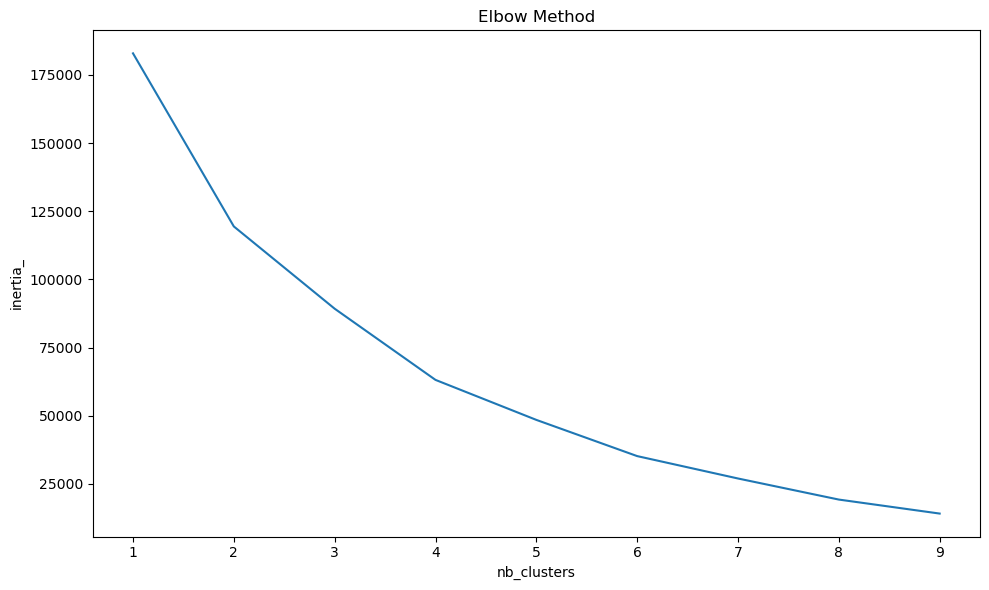

In [825]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [381]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [916]:
# Coefficient de silhouette

nb_cluster = [5,6,7,8]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [917]:
# dico
dico_sil

{5: 0.8696365967174998,
 6: 0.9376056458349062,
 7: 0.9589824106223805,
 8: 0.9611029465099215}

In [924]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,5,6,7,8
coeff_silhouette,0.869637,0.937606,0.958982,0.961103


In [34]:
# 9 clusters retenus
kmeans_Ncmde_rs1S = KMeans(n_clusters = 9, random_state=0, n_init = 10)
clusters_kmeans_Ncmde_rs1S = kmeans_Ncmde_rs1S.fit_predict(X)

In [35]:
df["ncmde_rs1s"] = clusters_kmeans_Ncmde_rs1S

In [36]:
# Centroides
centroides_kmeans_Ncmde_rs1S = kmeans_Ncmde_rs1S.cluster_centers_
centroides_kmeans_Ncmde_rs1S

array([[-0.28133742, -0.25703212],
       [-0.25297213,  1.5710716 ],
       [ 4.61815921,  8.59512487],
       [ 4.17390133, -0.21178903],
       [13.77362148, -0.12645328],
       [18.51017083, 30.57698392],
       [ 1.09027878, -0.25334494],
       [ 1.17450249,  3.71229178],
       [87.3597305 , -0.25703212]])

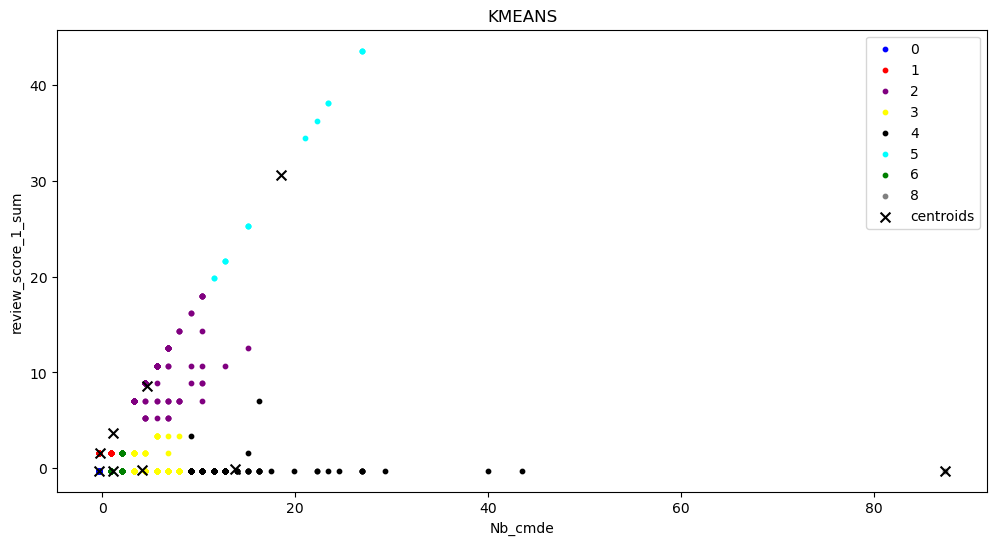

In [37]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2,3,4,5,6,8]
color_list = ["blue","red","purple","yellow","black","cyan","green","grey","pink"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_rs1s"]== k]
    plt.scatter(x = df_filter["Nb_cmde"], y = df_filter['review_score_1_sum'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_Ncmde_rs1S[:,0], y = centroides_kmeans_Ncmde_rs1S[:,1], color = "black", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("Nb_cmde")
plt.ylabel("review_score_1_sum")
plt.show()

MODELISATION ==> 'Nb_cmde', 'review_score_1_sum' :

coeff_silhouette ==> 0.9611029465099215

Couleur Cyan  ==> groupe des bon clients qui ont mal notés


##### 'Nb_cmde', 'Time_Answer_Review_H'

In [38]:
# SélEction des colonnes pertinentes (Fréquence, Montant)
X = df[['Nb_cmde', 'Time_Answer_Review_H']]

In [856]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

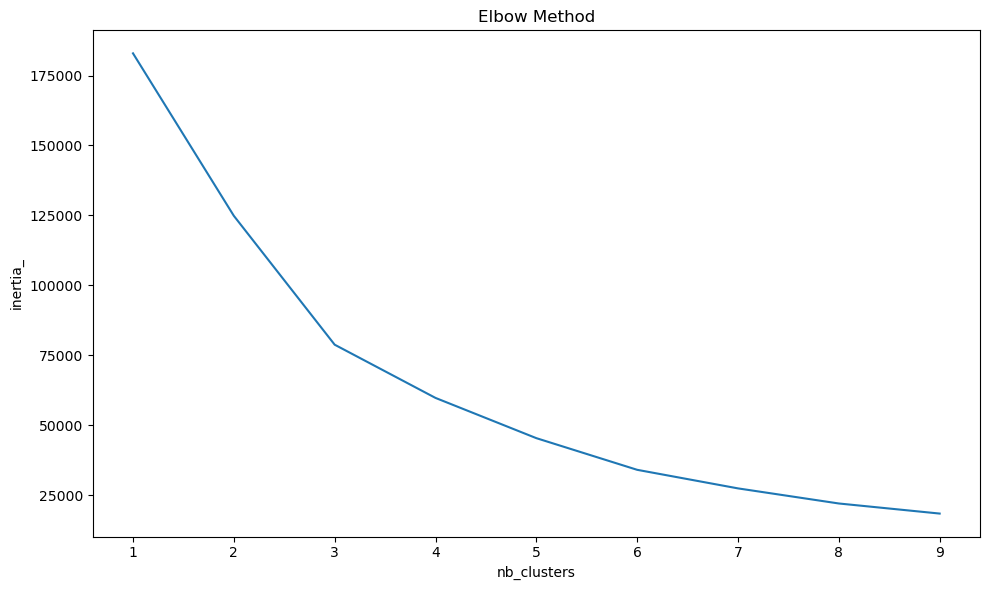

In [857]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [848]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [858]:
# Coefficient de silhouette

nb_cluster = [3,4,5,6]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [859]:
# dico
dico_sil

{3: 0.8433930722798756,
 4: 0.7980723249686634,
 5: 0.809092357354895,
 6: 0.8084590512698876}

In [860]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,3,4,5,6
coeff_silhouette,0.843393,0.798072,0.809092,0.808459


In [39]:
# 3 clusters retenus
kmeans_Ncmde_arT = KMeans(n_clusters = 3, random_state=0, n_init = 10)
clusters_kmeans_Ncmde_arT  = kmeans_Ncmde_arT.fit_predict(X)

In [40]:
df["ncmde_art"] = clusters_kmeans_Ncmde_arT

In [41]:
# Centroides
centroides_kmeans_Ncmde_arT = kmeans_Ncmde_arT.cluster_centers_
centroides_kmeans_Ncmde_arT

array([[-0.14610305, -0.03700191],
       [ 3.45277919, -0.03513293],
       [-0.04567818, 17.1962042 ]])

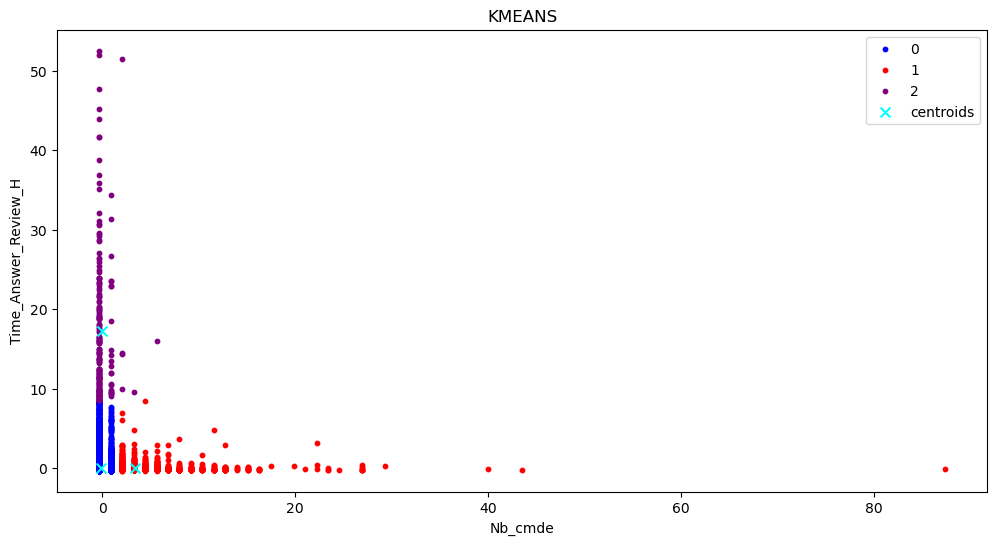

In [42]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2]
color_list = ["blue","red","purple","yellow","black","cyan"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_art"]== k]
    plt.scatter(x = df_filter["Nb_cmde"], y = df_filter['Time_Answer_Review_H'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_Ncmde_arT[:,0], y = centroides_kmeans_Ncmde_arT[:,1], color = "cyan", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("Nb_cmde")
plt.ylabel("Time_Answer_Review_H")
plt.show()

MODELISATION ==> 'Nb_cmde', 'Time_Answer_Review_H' :

Les clients "importants" ont une réponse rapide

coeff_silhouette ==> 0.0.843393

couleur rouge ==> Clients importants avec réponse rapide

couleur bleu ==> Clients moins importants avec réponse rapide

couleur violette ==> Clients moins important avec réponse lente



##### 'Nb_cmde', 'Delay_H_mean'

In [43]:
# SélEction des colonnes pertinentes (Fréquence, Montant)
X = df[['Nb_cmde', 'Delay_H_mean']]

In [871]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

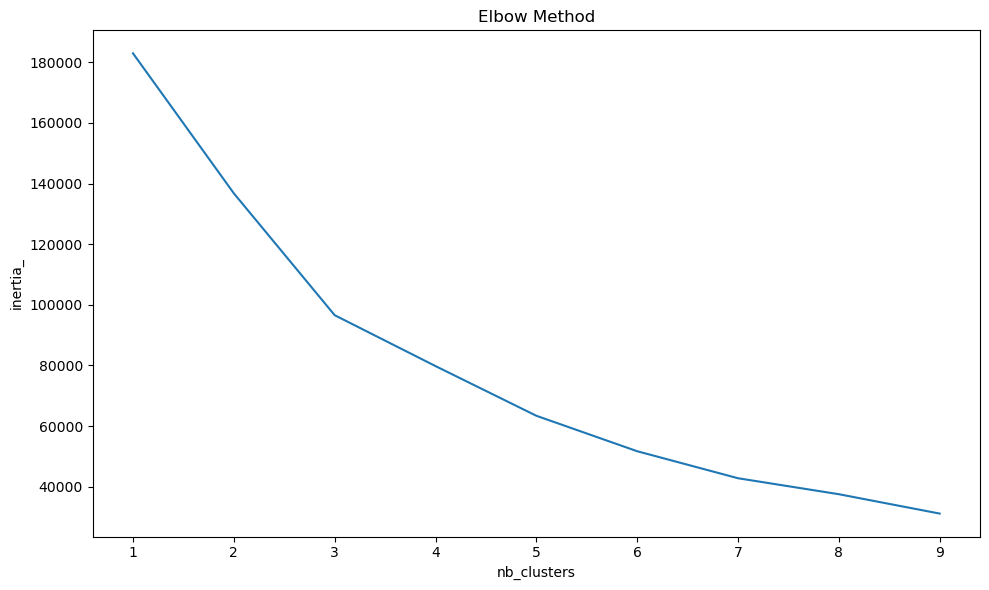

In [872]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [848]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [873]:
# Coefficient de silhouette

nb_cluster = [3,5,7]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [874]:
# dico
dico_sil

{3: 0.43230580247796563, 5: 0.5006841340143109, 7: 0.5054175351917245}

In [875]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,3,5,7
coeff_silhouette,0.432306,0.500684,0.505418


In [44]:
# 7 clusters retenus
kmeans_Ncmde_Delay = KMeans(n_clusters = 7, random_state=0, n_init = 10)
clusters_kmeans_Ncmde_Delay = kmeans_Ncmde_Delay.fit_predict(X)

In [45]:
df["ncmde_delay"] = clusters_kmeans_Ncmde_Delay

In [46]:
# Centroides
centroides_kmeans_Ncmde_Delay = kmeans_Ncmde_Delay.cluster_centers_
centroides_kmeans_Ncmde_Delay

array([[-0.27896166, -0.56272811],
       [ 4.26803867,  0.15915715],
       [-0.13789172,  1.68486681],
       [-0.28133742,  0.38931038],
       [-0.13356729, -2.69629254],
       [ 1.11161408,  0.0441588 ],
       [15.68488976,  0.14283879]])

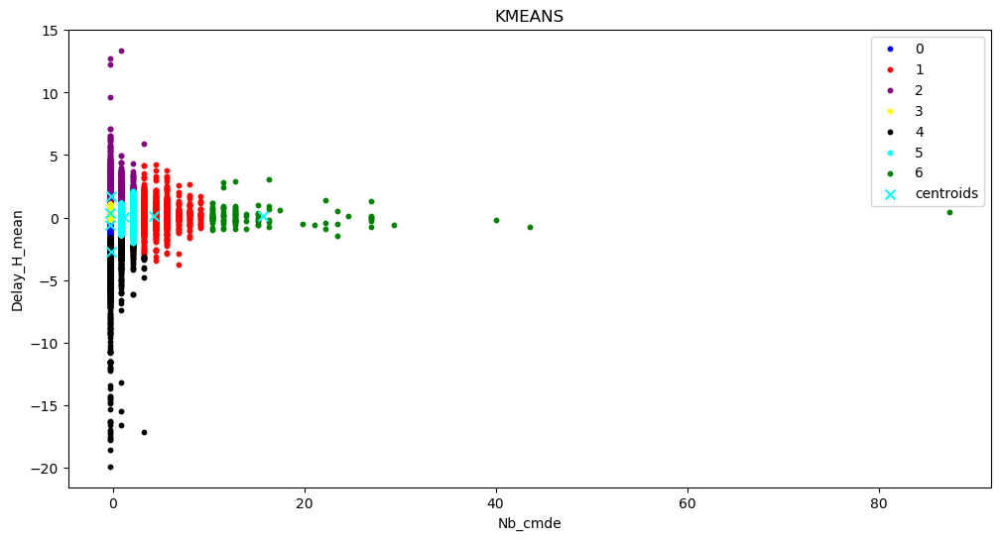

In [47]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2,3,4,5,6]
color_list = ["blue","red","purple","yellow","black","cyan","green"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_delay"]== k]
    plt.scatter(x = df_filter["Nb_cmde"], y = df_filter['Delay_H_mean'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_Ncmde_Delay[:,0], y = centroides_kmeans_Ncmde_Delay[:,1], color = "cyan", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("Nb_cmde")
plt.ylabel("Delay_H_mean")
plt.show()

MODELISATION ==> 'Nb_cmde', 'Delay_H_mean' :

coeff_silhouette ==> 0.505418


##### 'Nb_cmde', 'Volume_Colis_cm3_mean'

In [48]:
# SélEction des colonnes pertinentes (Fréquence, Montant)
X = df[['Nb_cmde', 'Volume_Colis_cm3_mean']]

In [891]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

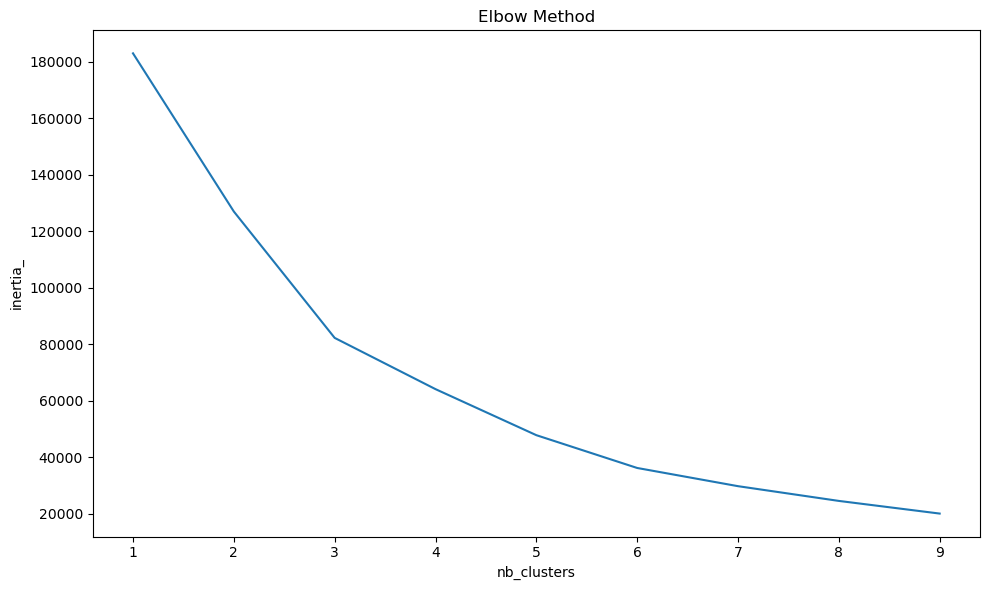

In [892]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [848]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [905]:
# Coefficient de silhouette

nb_cluster = [2,3,4,5,6]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [907]:
# dico
dico_sil

{2: 0.6846902832271897,
 3: 0.7173125227878776,
 4: 0.6704310317418057,
 5: 0.68688475958325,
 6: 0.6913912041615269}

In [908]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,2,3,4,5,6
coeff_silhouette,0.68469,0.717313,0.670431,0.686885,0.691391


In [49]:
# 3 clusters retenus
kmeans_Ncmde_Vol = KMeans(n_clusters = 3, random_state=0, n_init = 10)
clusters_kmeans_Ncmde_Vol = kmeans_Ncmde_Vol.fit_predict(X)

In [50]:
df["ncmde_vol"] = clusters_kmeans_Ncmde_Vol

In [51]:
# Centroides
centroides_kmeans_Ncmde_Vol = kmeans_Ncmde_Vol.cluster_centers_
centroides_kmeans_Ncmde_Vol

array([[-0.14530141, -0.24388216],
       [-0.12325348,  2.53790611],
       [ 3.4867747 , -0.0741086 ]])

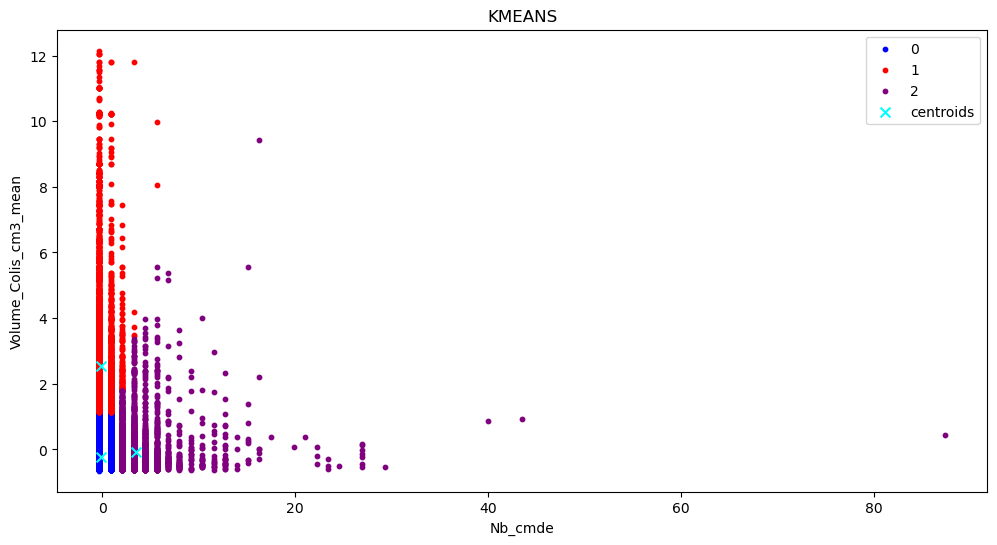

In [52]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2]
color_list = ["blue","red","purple","yellow","black","cyan","green"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_vol"]== k]
    plt.scatter(x = df_filter["Nb_cmde"], y = df_filter['Volume_Colis_cm3_mean'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_Ncmde_Vol[:,0], y = centroides_kmeans_Ncmde_Vol[:,1], color = "cyan", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("Nb_cmde")
plt.ylabel("Volume_Colis_cm3_mean")
plt.show()

MODELISATION ==> 'Nb_cmde', 'Volume_Colis_cm3_mean' :

coeff_silhouette ==> 0.717313

couleur rouge ==> gros colis petit client

couleur bleu ==> petit colis petit client

couleur violette ==> colis moyen client moyen



### II.2.3) Avec PCA

In [53]:
df.columns

Index(['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean',
       'ncmde_pays_lastt', 'ncmde_lastt', 'ncmde_pays', 'ncmde_lastT',
       'ncmde_rs1s', 'ncmde_art', 'ncmde_delay', 'ncmde_vol'],
      dtype='object')

In [54]:
df2 = df[['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean']]

##### Factorisation focus économie

In [55]:
df2_eco = df[['Nb_cmde', 'payment_value_sum','Time_last_cmde_H']]

In [56]:
from sklearn.decomposition import PCA

In [57]:
# assignation pca
X = df2_eco
pca = PCA()
pca.fit(X)
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[1.37966449 1.00014475 0.62022355]
[0.45988314 0.33337794 0.20673892]


In [58]:
# dataframe ratio_var
cumul_ratio_var = pd.DataFrame({"variance_ratio" : pca.explained_variance_ratio_}, index = np.arange(0,len(pca.explained_variance_ratio_)))
cumul_ratio_var

,variance_ratio
0,0.459883
1,0.333378
2,0.206739


In [59]:
# ratio cumulé
cumul_ratio_var["cumul"] = cumul_ratio_var["variance_ratio"].cumsum()
cumul_ratio_var = cumul_ratio_var*100

In [60]:
# Ajout du ratio cumulé
cumul_ratio_var  = cumul_ratio_var.round(1)
cumul_ratio_var

,variance_ratio,cumul
0,46.0,46.0
1,33.3,79.3
2,20.7,100.0


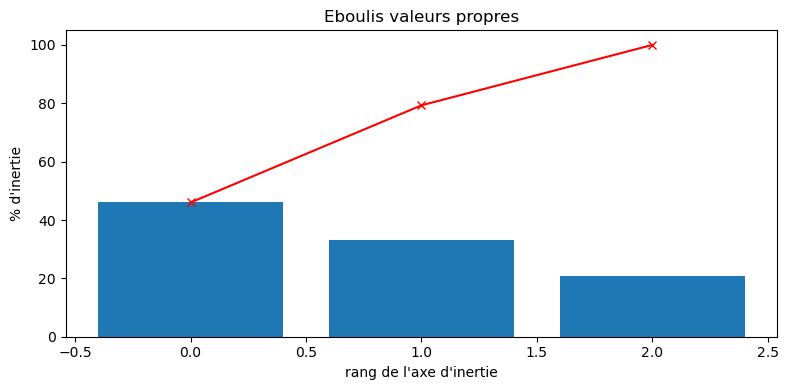

In [61]:
# Graphique des ratios de variance

plt.rcParams["figure.figsize"] = [8,4]
plt.bar(cumul_ratio_var.index, cumul_ratio_var["variance_ratio"])
plt.plot(cumul_ratio_var.index, cumul_ratio_var["cumul"],color = "r", marker = "x")
plt.ylabel ("% d'inertie")
plt.xlabel("rang de l'axe d'inertie")
plt.title("Eboulis valeurs propres")
plt.tight_layout()
plt.show()

In [62]:
# composantes
pcs = pca.components_
pcs = pd.DataFrame(data = pcs, index = np.arange(0,len(pca.explained_variance_)), columns = X.columns )
pcs

,Nb_cmde,payment_value_sum,Time_last_cmde_H
0,0.707131,0.707067,0.004698
1,0.010358,-0.017002,0.999802
2,-0.707007,0.706942,0.019346


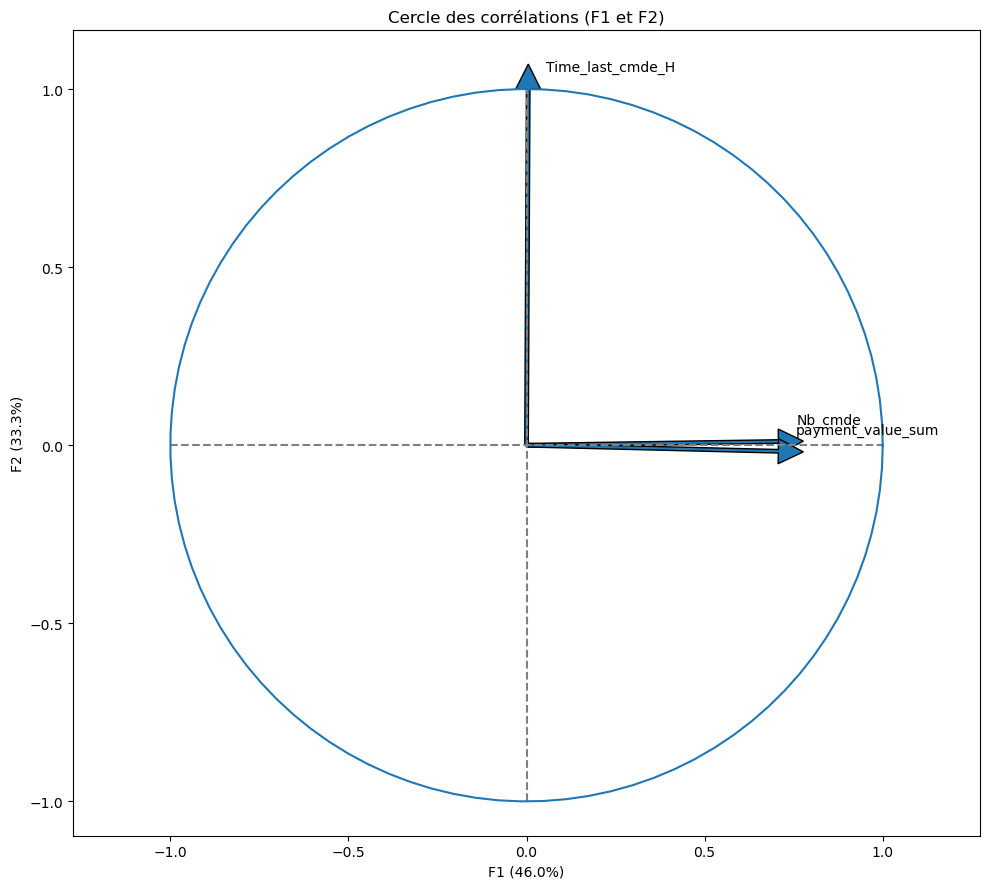

In [63]:
# Cercle des corrélations 
x,y = 0,1
fig, ax = plt.subplots(figsize=(10, 9))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,
             0,  # Start the arrow at the origin
             pca.components_[0, i],  #0 for PC1
             pca.components_[1, i],  #1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.01)

    plt.text(pca.components_[0, i] + 0.05,
             pca.components_[1, i] + 0.05,
             pcs.columns[i])
    
# affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')


# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt.axis('equal')
plt.tight_layout()
plt.show(block=False)

F2 est la durée depuis la dernière cmde
F1 est le nombre de cmde et la valeur de payment

In [64]:
# Séléection des 2 dimensions
X = df2_eco
pca = PCA(2)
pca.fit(X)
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[1.37966449 1.00014475]
[0.45988314 0.33337794]


In [65]:
# Nouveaux vecteurs F1 et F2
pca.transform(X)

array([[-0.28166865, -0.82315983],
       [-0.41005728, -0.80048117],
       [-0.33093026,  1.96694332],
       ...,
       [-0.30057903,  2.17080163],
       [-0.29062353, -0.77170728],
       [-0.34898093,  1.62026534]])

In [66]:
# df F1 et F2
df_cluster_eco = pd.DataFrame({"F1" : pca.transform(X)[:,0],"F2" : pca.transform(X)[:,1]})
df_cluster_eco

,F1,F2
0,-0.281669,-0.823160
1,-0.410057,-0.800481
2,-0.330930,1.966943
3,-0.385294,0.552908
4,-0.214639,0.332747
...,...,...
91467,5.038429,1.280467
91468,-0.341233,0.165305
91469,-0.300579,2.170802
91470,-0.290624,-0.771707


In [67]:
# SélEction des colonnes pertinentes (payment_value_sum, Récense)
X = df_cluster_eco[['F1', 'F2']]

In [187]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

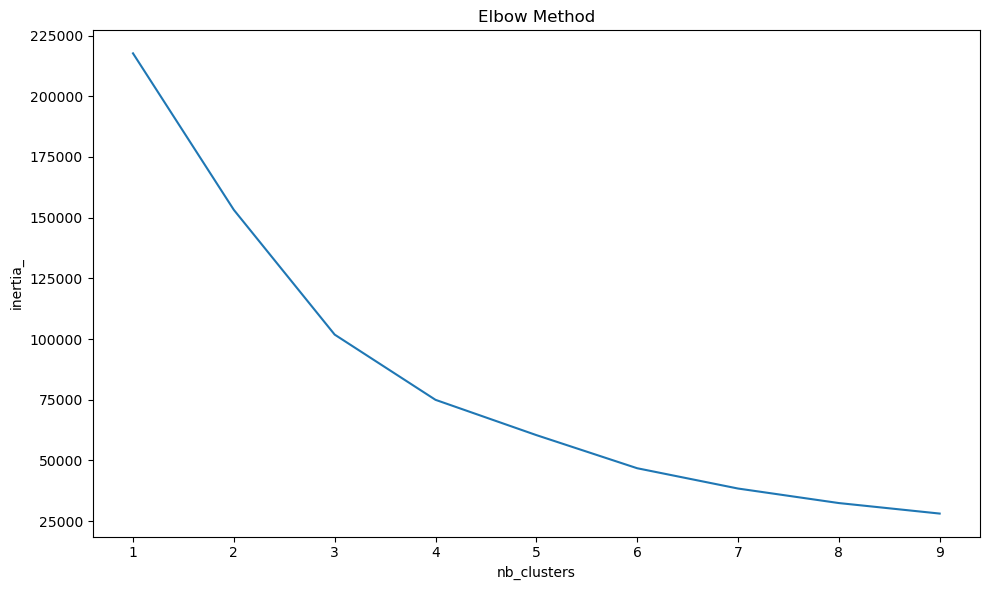

In [188]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [189]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [190]:
# Coefficient de silhouette

nb_cluster = [3,4,5,6]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [191]:
# dico
dico_sil

{3: 0.4941400639804112,
 4: 0.5091361881720962,
 5: 0.4486819261560902,
 6: 0.4600942968787505}

In [192]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,3,4,5,6
coeff_silhouette,0.49414,0.509136,0.448682,0.460094


In [68]:
# 4 clusters retenus
kmeans_pca_eco = KMeans(n_clusters = 4, random_state=0, n_init = 10)
clusters_kmeans_pca_eco = kmeans_pca_eco.fit_predict(X)

In [69]:
df_cluster_eco["clustering_1"] = clusters_kmeans_pca_eco

In [70]:
# Centroides
centroides_kmeans_pca_eco = kmeans_pca_eco.cluster_centers_
centroides_kmeans_pca_eco

array([[-1.47023435e-01, -7.21799968e-01],
       [ 2.47443056e+01, -2.04980585e-01],
       [-1.35319727e-01,  9.80947941e-01],
       [ 3.48478858e+00, -3.58634606e-03]])

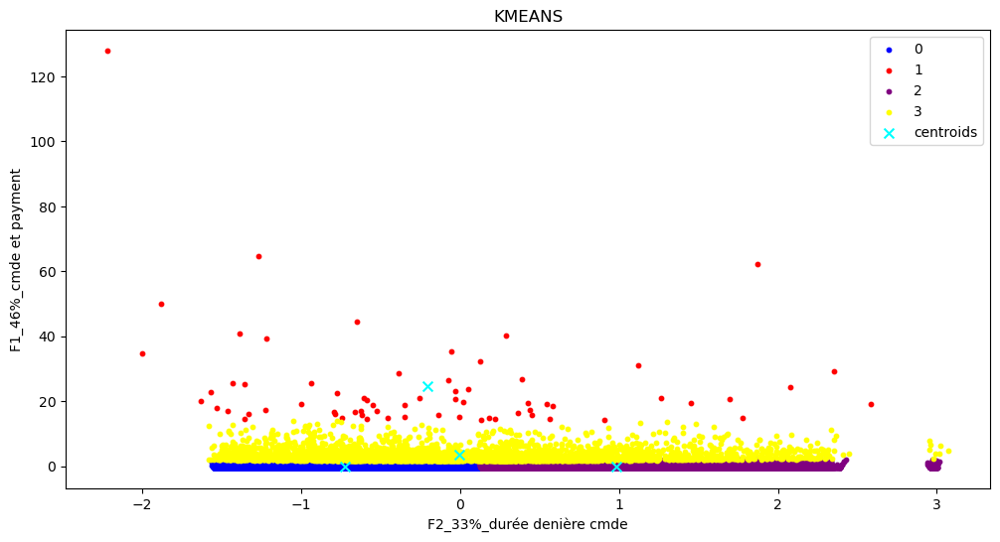

In [71]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2,3]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df_cluster_eco[df_cluster_eco["clustering_1"]== k]
    plt.scatter(x = df_filter['F2'], y = df_filter['F1'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_pca_eco[:,1], y = centroides_kmeans_pca_eco[:,0], color = "cyan", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel('F2_33%_durée denière cmde')
plt.ylabel('F1_46%_cmde et payment')
plt.show()

##### Factorisation satisfaction

In [72]:
df2.columns

Index(['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean'],
      dtype='object')

In [73]:
df3_satisfaction = df[['review_score_1_sum','review_score_5_sum','Time_last_cmde_H', 'Time_Answer_Review_H']]

In [74]:
from sklearn.decomposition import PCA

In [75]:
# assignation pca
X = df3_satisfaction
pca = PCA()
pca.fit(X)
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[1.20564327 1.04278813 0.95725454 0.79435779]
[0.30140752 0.26069418 0.23931102 0.19858728]


In [76]:
# dataframe ratio_var
cumul_ratio_var = pd.DataFrame({"variance_ratio" : pca.explained_variance_ratio_}, index = np.arange(0,len(pca.explained_variance_ratio_)))
cumul_ratio_var

,variance_ratio
0,0.301408
1,0.260694
2,0.239311
3,0.198587


In [77]:
# ratio cumulé
cumul_ratio_var["cumul"] = cumul_ratio_var["variance_ratio"].cumsum()
cumul_ratio_var = cumul_ratio_var*100

In [78]:
# Ajout du ratio cumulé
cumul_ratio_var  = cumul_ratio_var.round(1)
cumul_ratio_var

,variance_ratio,cumul
0,30.1,30.1
1,26.1,56.2
2,23.9,80.1
3,19.9,100.0


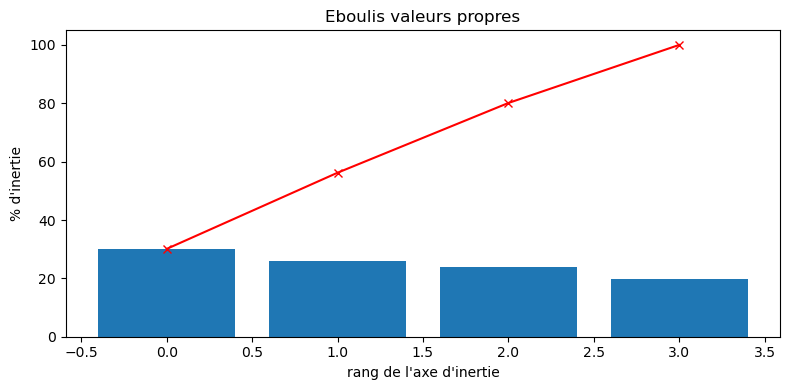

In [79]:
# Graphique des ratios de variance

plt.rcParams["figure.figsize"] = [8,4]
plt.bar(cumul_ratio_var.index, cumul_ratio_var["variance_ratio"])
plt.plot(cumul_ratio_var.index, cumul_ratio_var["cumul"],color = "r", marker = "x")
plt.ylabel ("% d'inertie")
plt.xlabel("rang de l'axe d'inertie")
plt.title("Eboulis valeurs propres")
plt.tight_layout()
plt.show()

In [80]:
# composantes
pcs = pca.components_
pcs = pd.DataFrame(data = pcs, index = np.arange(0,len(pca.explained_variance_)), columns = X.columns )
pcs

,review_score_1_sum,review_score_5_sum,Time_last_cmde_H,Time_Answer_Review_H
0,-0.706626,0.706491,0.009277,0.038256
1,0.010028,-0.037411,0.708934,0.704210
2,0.040333,0.011202,-0.704111,0.708855
3,0.706366,0.706643,0.039420,-0.012203


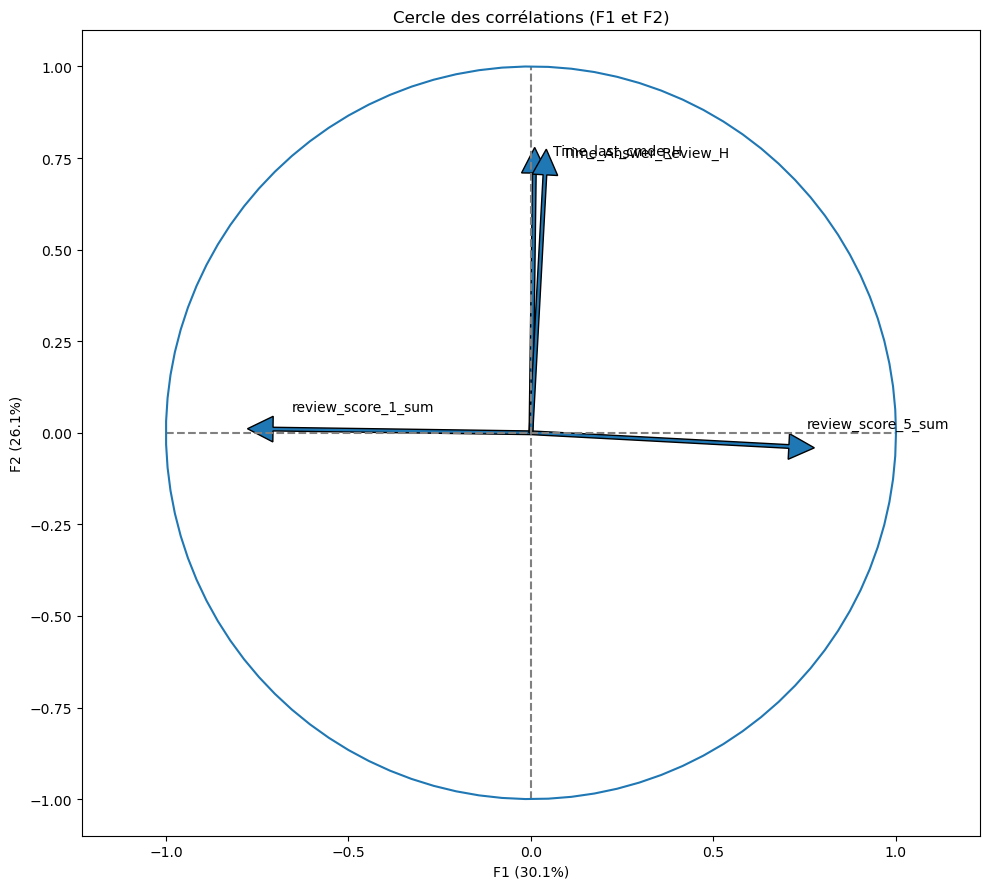

In [81]:
# Cercle des corrélations 
x,y = 0,1
fig, ax = plt.subplots(figsize=(10, 9))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,
             0,  # Start the arrow at the origin
             pca.components_[0, i],  #0 for PC1
             pca.components_[1, i],  #1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.01)

    plt.text(pca.components_[0, i] + 0.05,
             pca.components_[1, i] + 0.05,
             pcs.columns[i])
    
# affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')


# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt.axis('equal')
plt.tight_layout()
plt.show(block=False)

F2 est la durée depuis la dernière cmde + durée de non cmde
F1 est le niveau de satisfaction

In [82]:
# Séléection des 2 dimensions
X = df3_satisfaction
pca = PCA(2)
pca.fit(X)
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[1.20564327 1.04278813]
[0.30140752 0.26069418]


In [83]:
# Nouveaux vecteurs F1 et F2
pca.transform(X)

array([[ 0.42213296, -0.49678174],
       [-0.43500523, -0.69907076],
       [-0.40885237,  1.27285285],
       ...,
       [ 0.4423227 ,  1.48603069],
       [ 0.41506148, -0.59937617],
       [ 0.43653334,  1.08252532]])

In [84]:
# df F1 et F2
df_cluster_satisfaction = pd.DataFrame({"F1" : pca.transform(X)[:,0],"F2" : pca.transform(X)[:,1]})
df_cluster_satisfaction

,F1,F2
0,0.422133,-0.496782
1,-0.435005,-0.699071
2,-0.408852,1.272853
3,-0.422150,0.266299
4,0.434292,0.350037
...,...,...
91467,1.285294,1.010544
91468,-0.408269,0.313787
91469,0.442323,1.486031
91470,0.415061,-0.599376


In [85]:
# SélEction des colonnes pertinentes (payment_value_sum, Récense)
X = df_cluster_satisfaction[['F1', 'F2']]

In [681]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

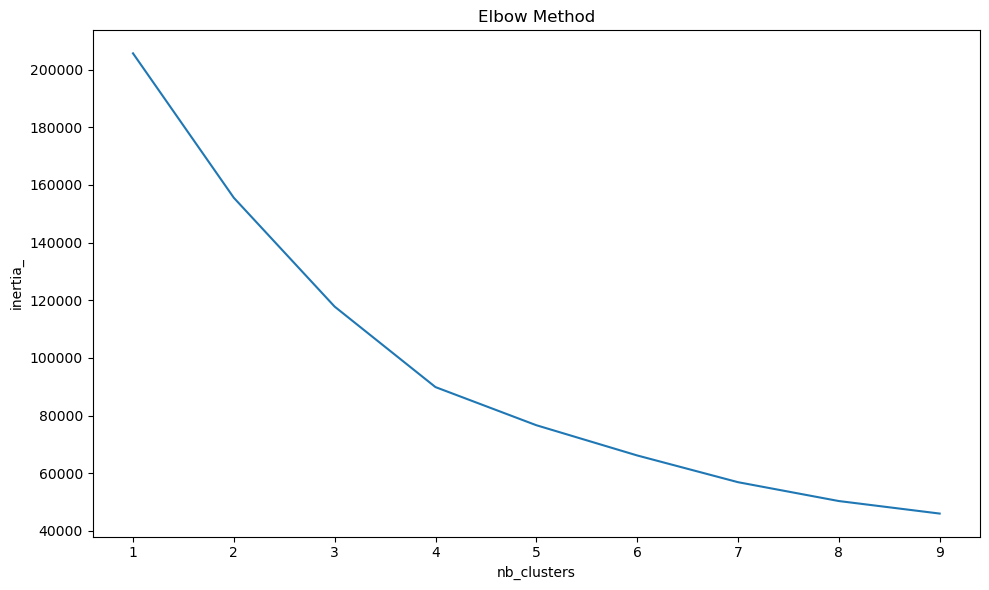

In [682]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [381]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [683]:
# Coefficient de silhouette

nb_cluster = [3,4,5]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [684]:
# dico
dico_sil

{3: 0.42356767601995493, 4: 0.41670759164457966, 5: 0.4084292010445027}

In [685]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,3,4,5
coeff_silhouette,0.423568,0.416708,0.408429


In [86]:
# 3 clusters retenus
kmeans_pca_satisfaction = KMeans(n_clusters = 3, random_state=0, n_init = 10)
clusters_kmeans_pca_satisfaction = kmeans_pca_satisfaction.fit_predict(X)

In [87]:
df_cluster_satisfaction["clustering_1"] = clusters_kmeans_pca_satisfaction

In [88]:
# Centroides
centroides_kmeans_pca_satisfaction = kmeans_pca_satisfaction.cluster_centers_
centroides_kmeans_pca_satisfaction 

array([[-2.25395581, -0.01269436],
       [ 0.24835958, -0.48977114],
       [ 0.23016351,  0.93691149]])

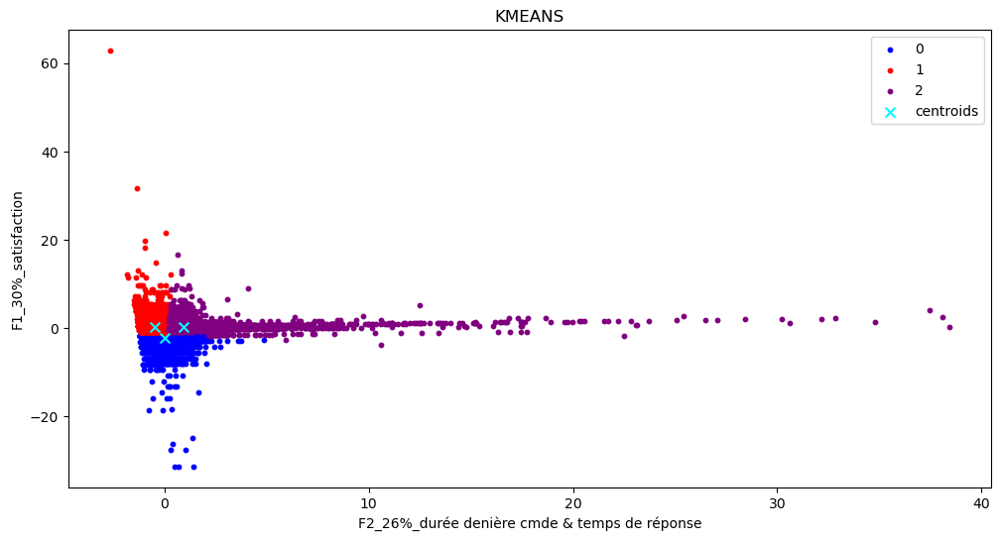

In [89]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df_cluster_satisfaction[df_cluster_satisfaction["clustering_1"]== k]
    plt.scatter(x = df_filter['F2'], y = df_filter['F1'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_pca_satisfaction[:,1], y = centroides_kmeans_pca_satisfaction[:,0], color = "cyan", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("F2_26%_durée denière cmde & temps de réponse")
plt.ylabel('F1_30%_satisfaction')
plt.show()

##### Factorisation Performance

In [90]:
df2.columns

Index(['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean'],
      dtype='object')

In [91]:
df4_Performance = df[['Nb_cmde','payment_value_sum',
     'Delay_H_mean','review_score_5_sum','review_score_1_sum','Time_Answer_Review_H']]

In [92]:
from sklearn.decomposition import PCA

In [93]:
# assignation pca
X = df4_Performance
pca = PCA()
pca.fit(X)
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[1.76707039 1.34713469 1.00040738 0.90798716 0.6936301  0.28383587]
[0.29450851 0.22451999 0.16673274 0.15132954 0.11560375 0.04730546]


In [94]:
# dataframe ratio_var
cumul_ratio_var = pd.DataFrame({"variance_ratio" : pca.explained_variance_ratio_}, index = np.arange(0,len(pca.explained_variance_ratio_)))
cumul_ratio_var

,variance_ratio
0,0.294509
1,0.224520
2,0.166733
3,0.151330
4,0.115604
5,0.047305


In [95]:
# ratio cumulé
cumul_ratio_var["cumul"] = cumul_ratio_var["variance_ratio"].cumsum()
cumul_ratio_var = cumul_ratio_var*100

In [96]:
# Ajout du ratio cumulé
cumul_ratio_var  = cumul_ratio_var.round(1)
cumul_ratio_var

,variance_ratio,cumul
0,29.5,29.5
1,22.5,51.9
2,16.7,68.6
3,15.1,83.7
4,11.6,95.3
5,4.7,100.0


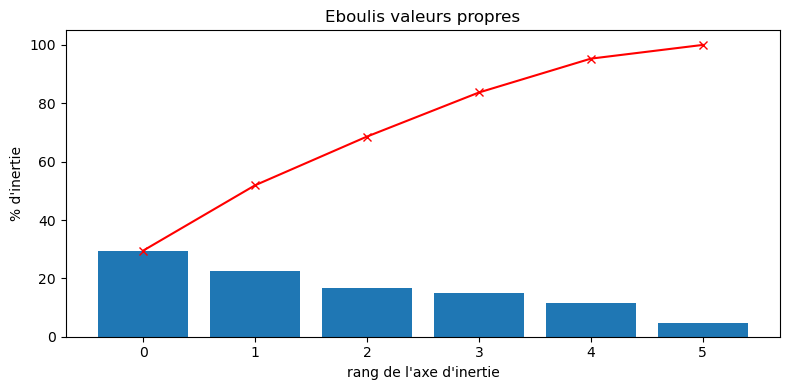

In [97]:
# Graphique des ratios de variance

plt.rcParams["figure.figsize"] = [8,4]
plt.bar(cumul_ratio_var.index, cumul_ratio_var["variance_ratio"])
plt.plot(cumul_ratio_var.index, cumul_ratio_var["cumul"],color = "r", marker = "x")
plt.ylabel ("% d'inertie")
plt.xlabel("rang de l'axe d'inertie")
plt.title("Eboulis valeurs propres")
plt.tight_layout()
plt.show()

In [98]:
# composantes
pcs = pca.components_
pcs = pd.DataFrame(data = pcs, index = np.arange(0,len(pca.explained_variance_)), columns = X.columns )
pcs

,Nb_cmde,payment_value_sum,Delay_H_mean,review_score_5_sum,review_score_1_sum,Time_Answer_Review_H
0,0.673139,0.502478,0.040579,0.419374,0.341870,0.001527
1,0.062330,-0.184678,0.481569,0.582849,-0.623606,0.038754
2,-0.016410,0.031562,0.066287,-0.059398,0.046478,0.994310
3,-0.130205,0.293020,0.841465,-0.378284,0.190301,-0.099041
4,-0.266897,0.782801,-0.232000,-0.074123,-0.506596,0.005466
5,0.674197,-0.117368,-0.012756,-0.576447,-0.446347,0.002131


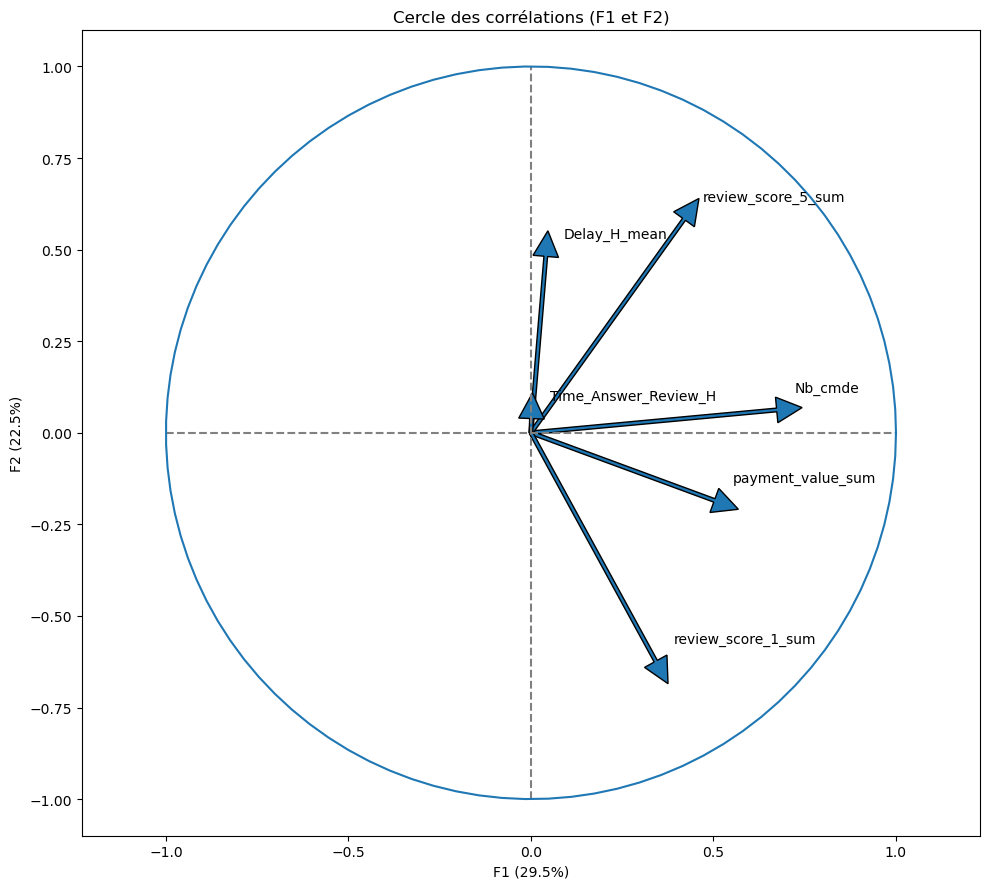

In [99]:
# Cercle des corrélations 
x,y = 0,1
fig, ax = plt.subplots(figsize=(10, 9))
for i in range(0, pca.components_.shape[1]):
    ax.arrow(0,
             0,  # Start the arrow at the origin
             pca.components_[0, i],  #0 for PC1
             pca.components_[1, i],  #1 for PC2
             head_width=0.07,
             head_length=0.07, 
             width=0.01)

    plt.text(pca.components_[0, i] + 0.05,
             pca.components_[1, i] + 0.05,
             pcs.columns[i])
    
# affichage des lignes horizontales et verticales
plt.plot([-1, 1], [0, 0], color='grey', ls='--')
plt.plot([0, 0], [-1, 1], color='grey', ls='--')


# nom des axes, avec le pourcentage d'inertie expliqué
plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


an = np.linspace(0, 2 * np.pi, 100)
plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
plt.axis('equal')
plt.tight_layout()
plt.show(block=False)

F2 22.5 % perf délai
F1 29.5% perf cmde payment

In [100]:
# Séléection des 2 dimensions
X = df4_Performance
pca = PCA(2)
pca.fit(X)
print(pca.explained_variance_)
print(pca.explained_variance_ratio_)

[1.76707039 1.34713469]
[0.29450851 0.22451999]


In [101]:
# Nouveaux vecteurs F1 et F2
pca.transform(X)

array([[-0.21751821,  0.03134195],
       [-0.80941969, -0.63953744],
       [-0.7739311 , -0.79300097],
       ...,
       [-0.13918398,  1.24359539],
       [-0.18660158,  0.47413058],
       [-0.22763217,  0.59188158]])

In [102]:
# df F1 et F2
df_cluster_performance = pd.DataFrame({"F1" : pca.transform(X)[:,0],"F2" : pca.transform(X)[:,1]})
df_cluster_performance

,F1,F2
0,-0.217518,0.031342
1,-0.809420,-0.639537
2,-0.773931,-0.793001
3,-0.768690,-0.316025
4,-0.161998,0.155467
...,...,...
91467,4.348975,0.706878
91468,-0.771831,-0.742775
91469,-0.139184,1.243595
91470,-0.186602,0.474131


In [103]:
# SélEction des colonnes pertinentes
X = df_cluster_performance[['F1', 'F2']]

In [1075]:
inertia = []
for i in np.arange(1,10) :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

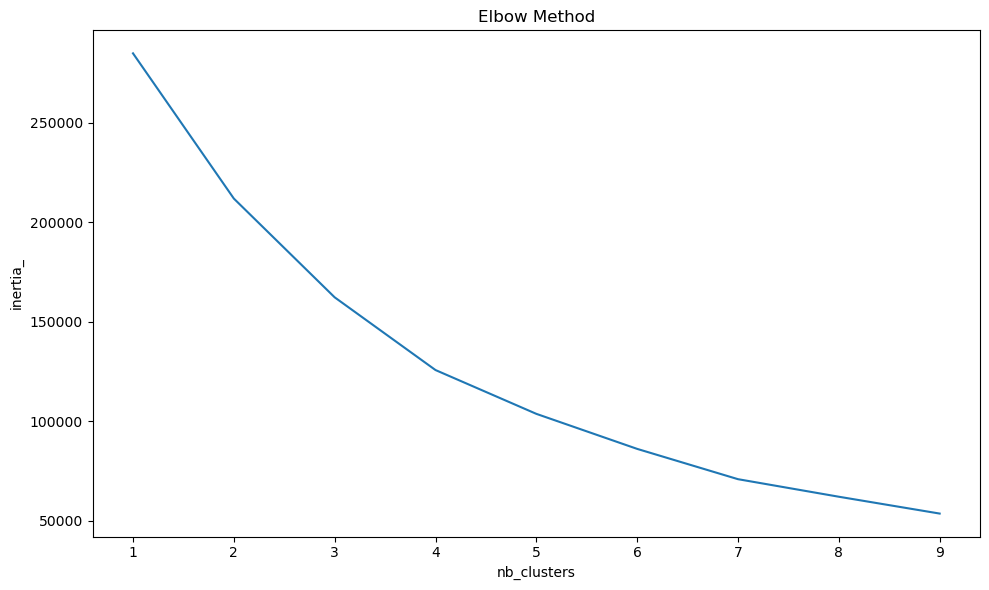

In [1076]:
# Elbow Method
plt.rcParams["figure.figsize"] = [10,6]
plt.plot(np.arange(1,10),inertia)
plt.title("Elbow Method")
plt.ylabel("inertia_")
plt.xlabel("nb_clusters")
plt.tight_layout()
plt.show()

In [381]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [1077]:
# Coefficient de silhouette

nb_cluster = [2,3,4,5,6,7]
dico_sil = {}

for i in nb_cluster :
    kmeans = KMeans(n_clusters = i, random_state=0, n_init = 10)
    cluster_labels = kmeans.fit_predict(X)
    sihouette_coeff = silhouette_score(X, cluster_labels)
    dico_sil[i] = sihouette_coeff

In [1078]:
# dico
dico_sil

{2: 0.7759533569815323,
 3: 0.6163641788361884,
 4: 0.6285479181727213,
 5: 0.6135506441901749,
 6: 0.605379308868092,
 7: 0.4943501179437462}

In [1079]:
# dataframre coeff_silhouette
pd.DataFrame(dico_sil, index = ["coeff_silhouette"])

,2,3,4,5,6,7
coeff_silhouette,0.775953,0.616364,0.628548,0.613551,0.605379,0.49435


In [104]:
# 2 clusters retenus
kmeans_pca_perf = KMeans(n_clusters = 2, random_state=0, n_init = 10)
clusters_kmeans_pca_perf = kmeans_pca_perf.fit_predict(X)

In [105]:
df_cluster_performance["clustering_1"] = clusters_kmeans_pca_perf

In [106]:
# Centroides
centroides_kmeans_pca_perf = kmeans_pca_perf.cluster_centers_
centroides_kmeans_pca_perf

array([[-0.1647455 , -0.00603989],
       [ 4.83512197,  0.17726501]])

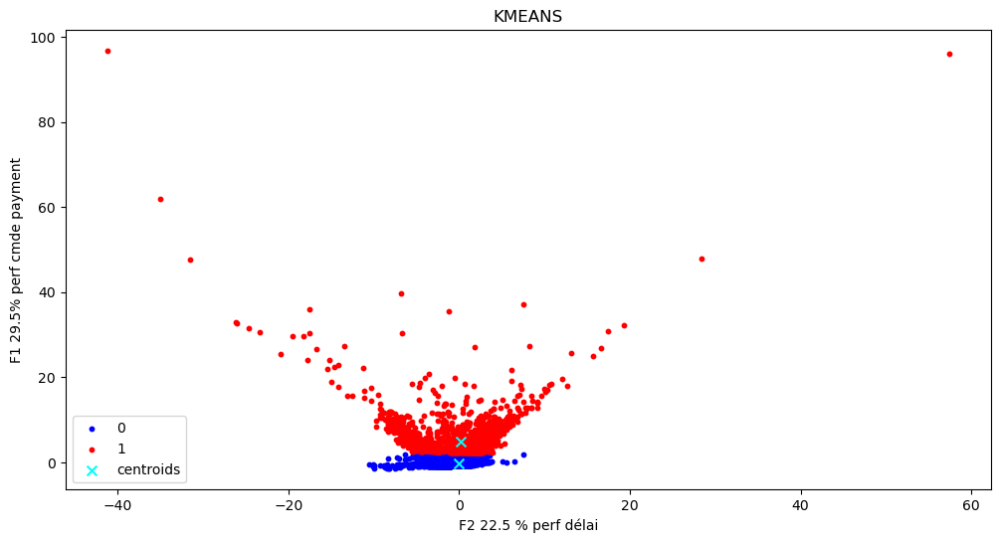

In [107]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df_cluster_performance[df_cluster_performance["clustering_1"]== k]
    plt.scatter(x = df_filter['F2'], y = df_filter['F1'], color = color, label = k, s = 10)
plt.scatter(x = centroides_kmeans_pca_perf[:,1], y = centroides_kmeans_pca_perf[:,0], color = "cyan", label = "centroids", s = 50, marker = "x")
plt.legend()
plt.title("KMEANS")
plt.xlabel("F2 22.5 % perf délai")
plt.ylabel('F1 29.5% perf cmde payment')
plt.show()



### II.2.4) Choix des modélisations et interprétations

In [108]:
# Rajout des derniers clusters au df
df["pca_economique"] = df_cluster_eco["clustering_1"]
df["pca_satisfaction"] = df_cluster_satisfaction["clustering_1"] 

In [109]:
df.columns

Index(['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean',
       'ncmde_pays_lastt', 'ncmde_lastt', 'ncmde_pays', 'ncmde_lastT',
       'ncmde_rs1s', 'ncmde_art', 'ncmde_delay', 'ncmde_vol', 'pca_economique',
       'pca_satisfaction'],
      dtype='object')

In [110]:
df_clusters = df[['ncmde_pays','ncmde_art','ncmde_vol','pca_economique',
       'pca_satisfaction']]
df_clusters

,ncmde_pays,ncmde_art,ncmde_vol,pca_economique,pca_satisfaction
0,0,0,0,0,1
1,0,0,0,0,1
2,0,0,1,2,2
3,0,0,0,2,2
4,0,0,0,2,2
...,...,...,...,...,...
91467,1,0,1,3,2
91468,0,0,0,2,2
91469,0,0,0,2,2
91470,0,0,0,0,1


In [111]:
# Transfo inverse normaliosation
inverse_transfo = scaler.inverse_transform(df[['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean']])

In [112]:
# dataframe valeur réelles et clusturs
df_inverse = pd.DataFrame(inverse_transfo, columns = ['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean'] )

In [113]:
# Fusion des avec dataframe clusters
df_inverse = df_inverse.merge(df_clusters, left_index = True, right_index = True)

In [114]:
df = df_inverse.round(2)

In [115]:
col_data_list = ['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean']

In [116]:
# Fonction pour courbe de sensité
def displot_analyse_clusters(df,col_cluster,col_variable,n_cluster_list) :
    plt.rcParams["figure.figsize"] = [12,5]
    i=0
    for num_cluster in n_cluster_list :
        sns.displot(data = df[df[col_cluster]==num_cluster], x = col_variable, kde = True)
        plt.title(f"displot_{num_cluster}_{col_variable}")
        plt.xticks(rotation = 90)
    plt.tight_layout()
    plt.show()

In [117]:
# Fonction pour box_plot
def box_plot_analyse_clusters(df,col_cluster,col_data_list) :
    plt.rcParams["figure.figsize"] = [12,50]
    i=0
    for col_variable in col_data_list :
        i+=1
        plt.subplot(len(col_data_list),1,i) 
        sns.boxplot(data = df ,x = col_cluster ,y = col_variable, showmeans = True)
        plt.title(f"box_plot_clusters_{col_variable}")
        plt.xlabel("clusters")
        plt.xticks(rotation = 90)
    plt.tight_layout()
    plt.show()

In [118]:
# Fonction pour comptage individus
def count_plot(df,col_cluster,title) :
    plt.rcParams["figure.figsize"] = [12,3]
    sns.countplot(data = df, x = col_cluster)
    plt.title(title)
    plt.tight_layout()
    plt.show()

In [119]:
# Fonction pour répartitions variables_clusters

def graph_repartition_variables_clusters(df,col_cluster):
# groupement par cluster
    cluster_grouped = df.pivot_table(columns = col_cluster, aggfunc = np.sum)
# graphique bar    
    plt.rcParams["figure.figsize"] = [12,50]
    i=0
    for index in cluster_grouped.index :
        i+=1
        plt.subplot(len(cluster_grouped),1,i)
        # bar_plot
        sns.barplot(x = cluster_grouped.columns, y = cluster_grouped.loc[index])
        plt.title(f"Répartition par cluster : {index}")
    plt.tight_layout()
    plt.show()

#### II.2.4.1) Modèle : Nb_cmde , payment_value_sum 

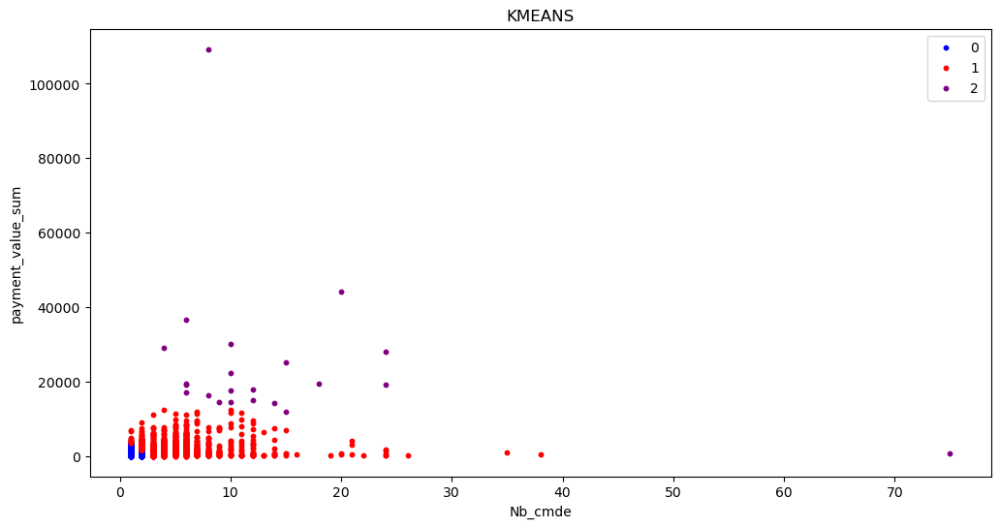

In [120]:

# Modèle : Nb_cmde , payment_value_sum 

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_pays"]== k]
    plt.scatter(x = df_filter["Nb_cmde"], y = df_filter['payment_value_sum'], color = color, label = k, s = 10)
plt.legend()
plt.title("KMEANS")
plt.xlabel("Nb_cmde")
plt.ylabel("payment_value_sum")
plt.show()

In [121]:
# filtre sur le cluster pour dataframe
df_ncmde_pays = df[['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean','ncmde_pays']]

In [122]:
# Nb individus dans les clusters
df_ncmde_pays["ncmde_pays"].value_counts()

0    87607
1     3843
2       22
Name: ncmde_pays, dtype: int64

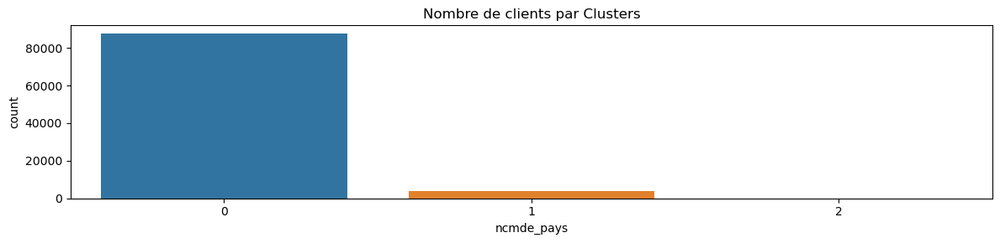

In [123]:
# Nombre de Clients par Clusters
count_plot(df_ncmde_pays,"ncmde_pays","Nombre de clients par Clusters")

In [124]:
# Moyenne des indicateurs pour chaque cluster

agreg_mean_ncmde_pays = df_ncmde_pays.groupby(by= "ncmde_pays").mean()
agreg_mean_ncmde_pays

,Nb_cmde,payment_value_sum,review_score_1_sum,review_score_2_sum,review_score_3_sum,review_score_4_sum,review_score_5_sum,payment_type_boleto_sum,payment_type_credit_card_sum,payment_type_debit_card_sum,payment_type_voucher_sum,Time_last_cmde_H,Time_Answer_Review_H,Delay_H_mean,product_weight_g_mean,Volume_Colis_cm3_mean
ncmde_pays,,,,,,,,,,,,,,,,
0,1.112833,168.762227,0.110996,0.034723,0.093086,0.217825,0.656203,0.218008,0.844670,0.016974,0.033182,50603.069618,75.789146,267.530614,2092.687063,15099.432397
1,4.003903,1065.530481,0.781681,0.207650,0.353110,0.699714,1.961749,0.735623,2.442103,0.035129,0.791049,50630.768623,75.114832,296.005280,2363.041486,17275.100208
2,14.636364,24585.961364,6.045455,0.000000,0.954545,2.000000,5.636364,4.681818,6.545455,0.000000,3.409091,50339.164545,57.928636,305.076818,4681.765455,32550.710455


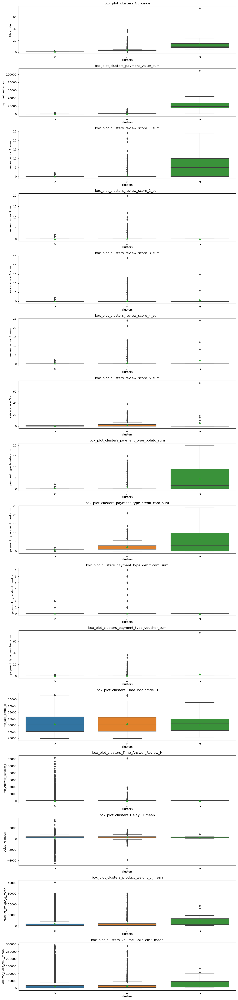

In [125]:
# Analyse box_plot
box_plot_analyse_clusters(df_ncmde_pays,'ncmde_pays',col_data_list)

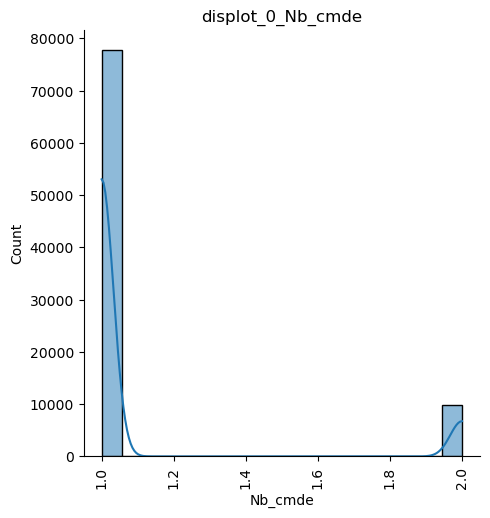

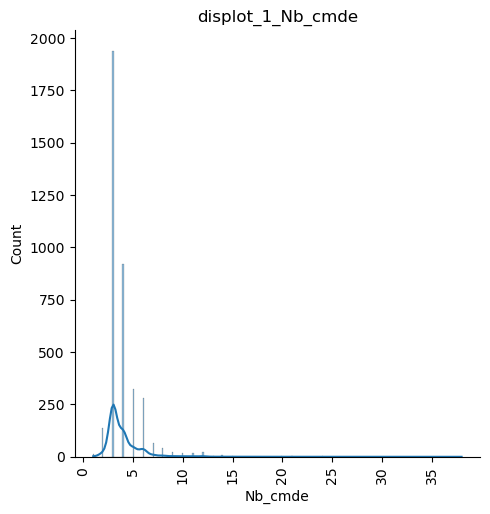

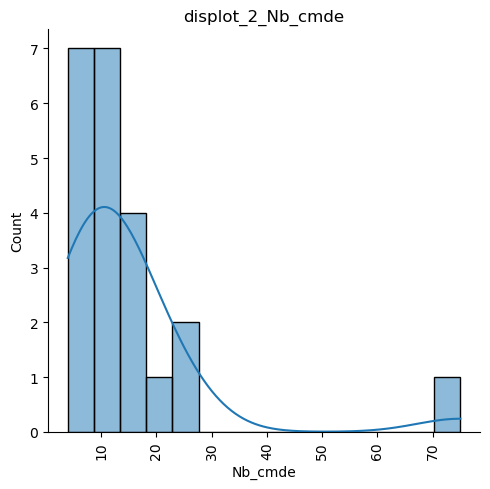

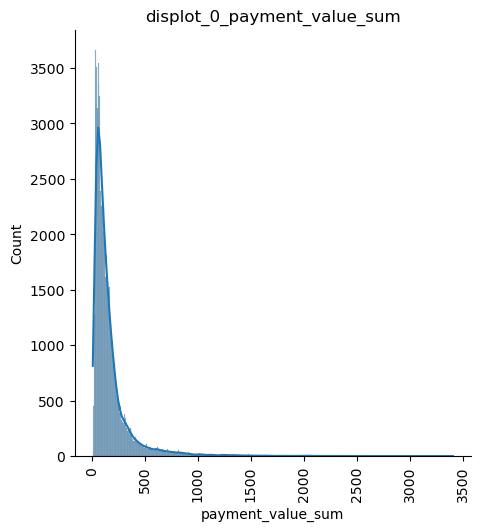

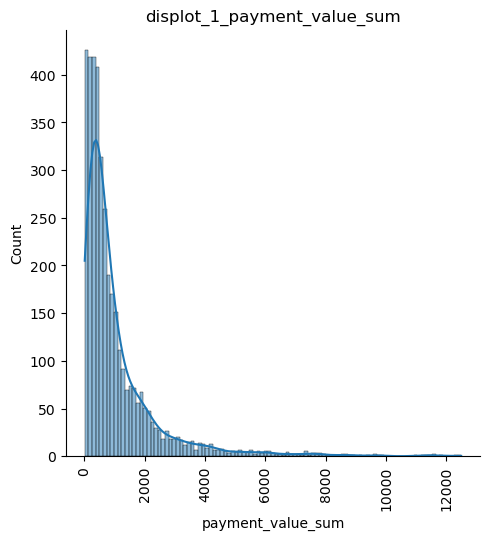

...

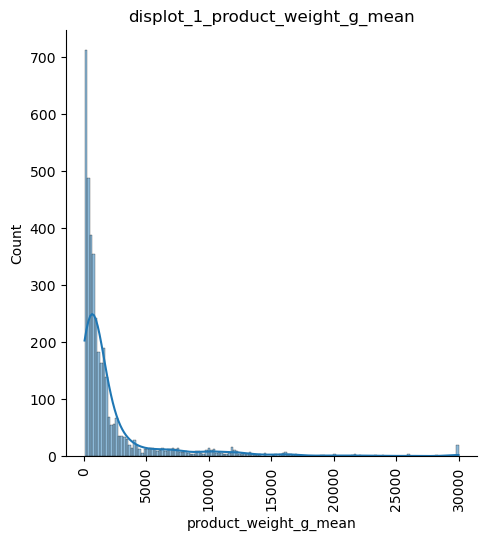

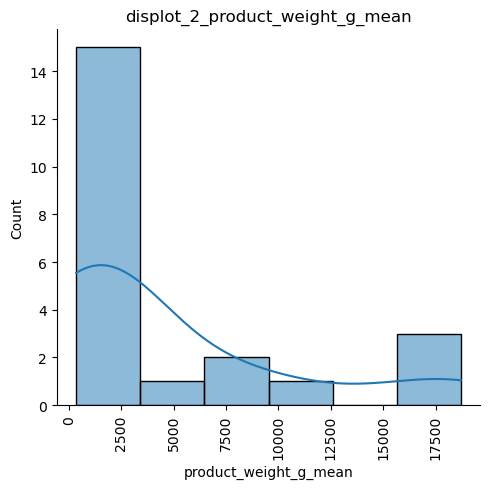

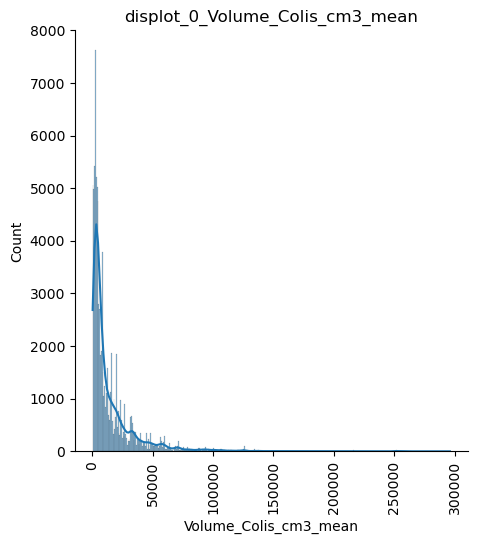

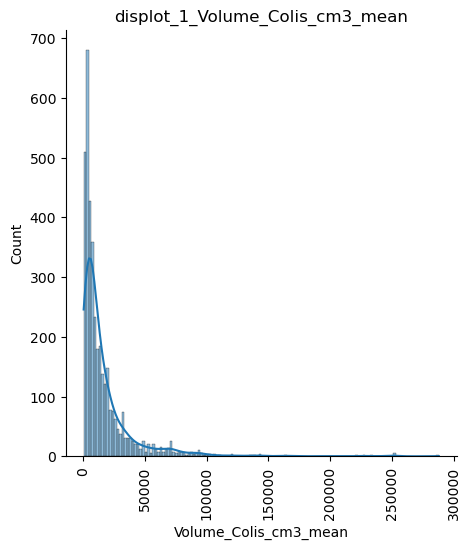

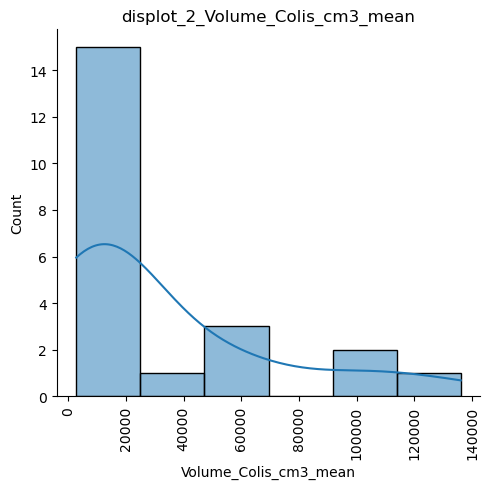

In [126]:
# Analyse des distributions
for col_variable in col_data_list :
    displot_analyse_clusters(df_ncmde_pays,"ncmde_pays",col_variable,[0,1,2])

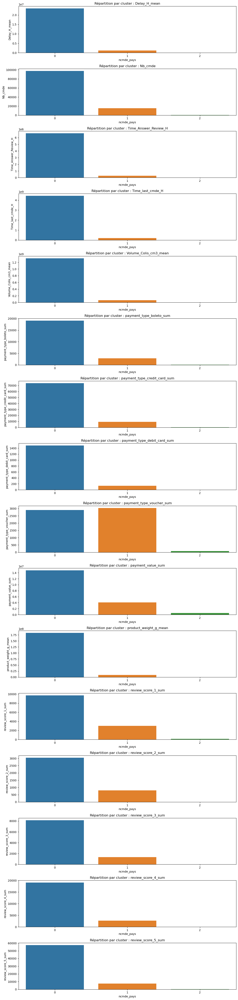

In [127]:
# Barplot de répartition dans les clusters
graph_repartition_variables_clusters(df_ncmde_pays,"ncmde_pays")

#### II.2.4.2) Modèle : Nb_cmde , Time_Answer_Review_H

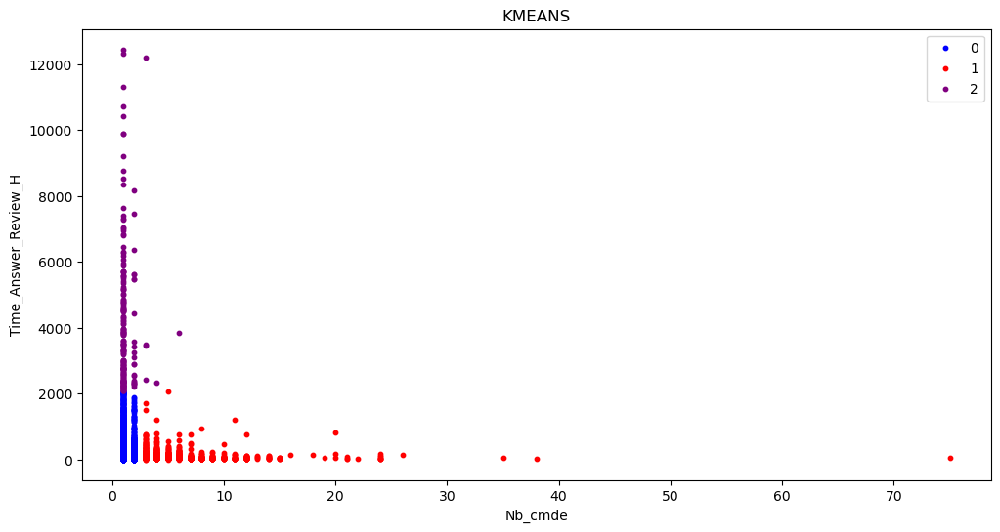

In [128]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2]
color_list = ["blue","red","purple","yellow","black","cyan"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_art"]== k]
    plt.scatter(x = df_filter["Nb_cmde"], y = df_filter['Time_Answer_Review_H'], color = color, label = k, s = 10)
plt.legend()
plt.title("KMEANS")
plt.xlabel("Nb_cmde")
plt.ylabel("Time_Answer_Review_H")
plt.show()

In [129]:
# filtre sur le cluster pour dataframe
df_ncmde_art = df[['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean','ncmde_art']]

In [130]:
# Nb individus dans les clusters
df_ncmde_art["ncmde_art"].value_counts()

0    87568
1     3708
2      196
Name: ncmde_art, dtype: int64

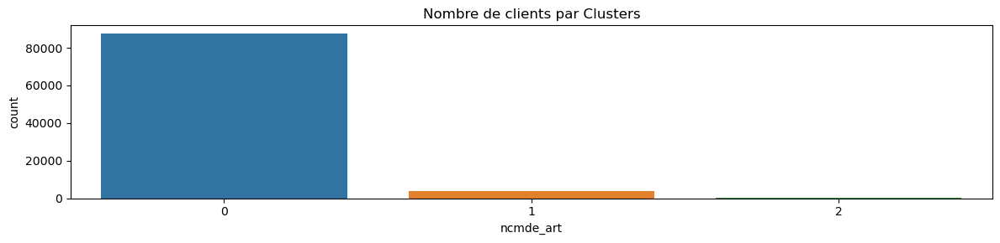

In [131]:
# Nombre de Clients par Clusters
count_plot(df_ncmde_art,"ncmde_art","Nombre de clients par Clusters")

In [132]:
# Moyenne des indicateurs pour chaque cluster

agreg_mean_ncmde_art = df_ncmde_art.groupby(by= "ncmde_art").mean()
agreg_mean_ncmde_art

,Nb_cmde,payment_value_sum,review_score_1_sum,review_score_2_sum,review_score_3_sum,review_score_4_sum,review_score_5_sum,payment_type_boleto_sum,payment_type_credit_card_sum,payment_type_debit_card_sum,payment_type_voucher_sum,Time_last_cmde_H,Time_Answer_Review_H,Delay_H_mean,product_weight_g_mean,Volume_Colis_cm3_mean
ncmde_art,,,,,,,,,,,,,,,,
0,1.114186,173.494407,0.111559,0.034841,0.093288,0.218265,0.656233,0.218436,0.845674,0.016981,0.033094,50596.649160,67.039428,267.507649,2106.374543,15178.273108
1,4.152913,1130.904256,0.827940,0.210895,0.364347,0.720334,2.029396,0.772114,2.507551,0.035599,0.837648,50626.302036,67.479757,295.862780,2054.766659,15584.804765
2,1.198980,176.152959,0.112245,0.035714,0.066327,0.163265,0.821429,0.193878,0.897959,0.015306,0.091837,53545.529643,4126.922908,304.313776,2286.336735,15310.327347


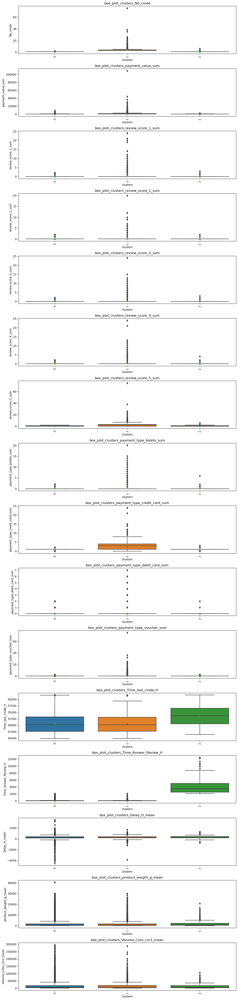

In [133]:
# Analyse box_plot
box_plot_analyse_clusters(df_ncmde_art,'ncmde_art',col_data_list)

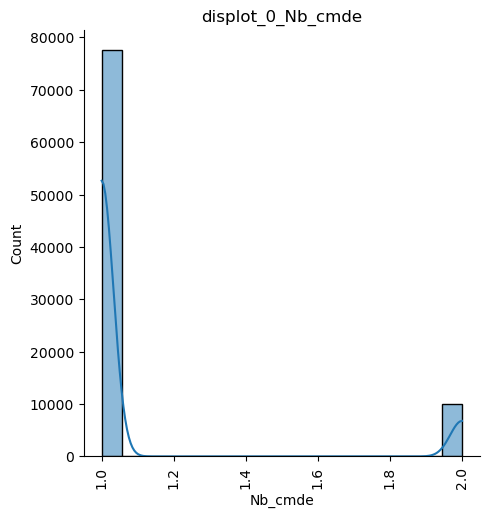

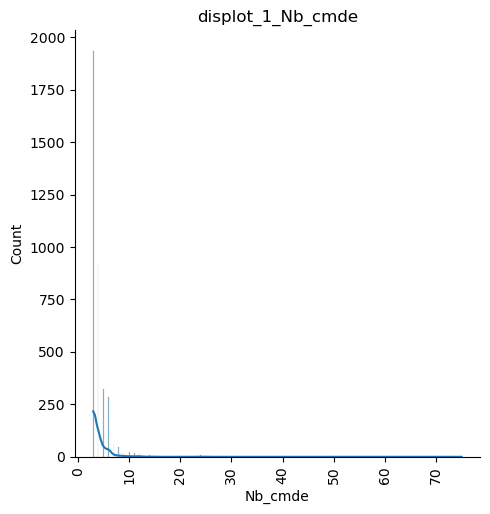

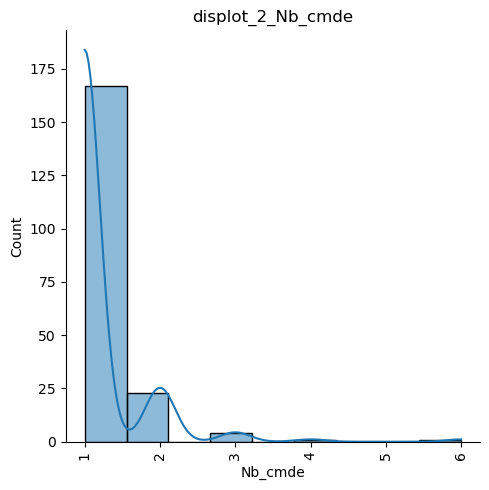

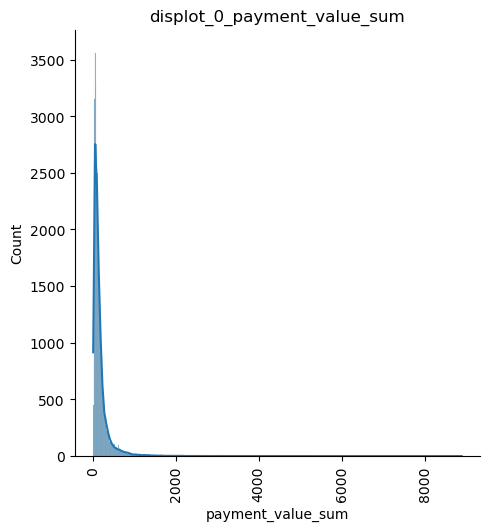

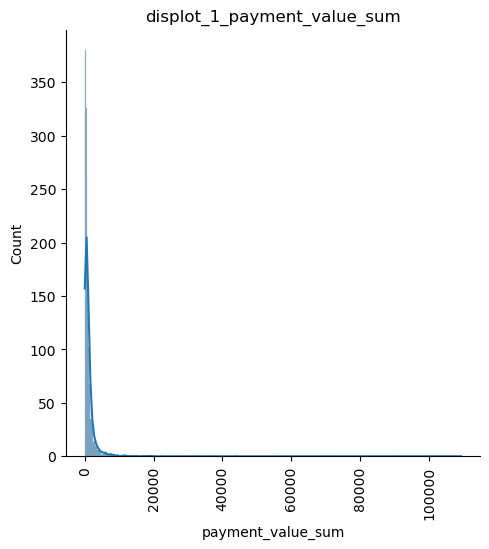

...

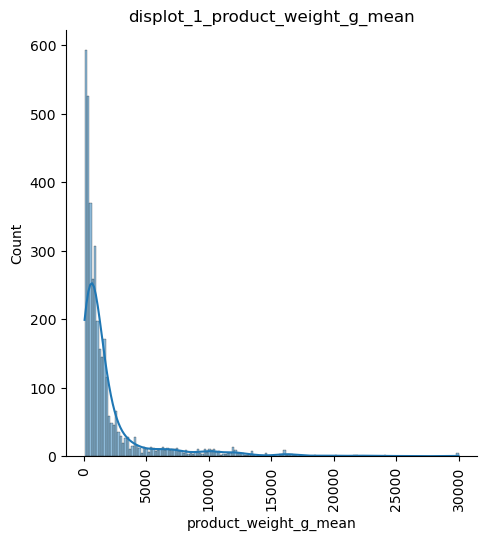

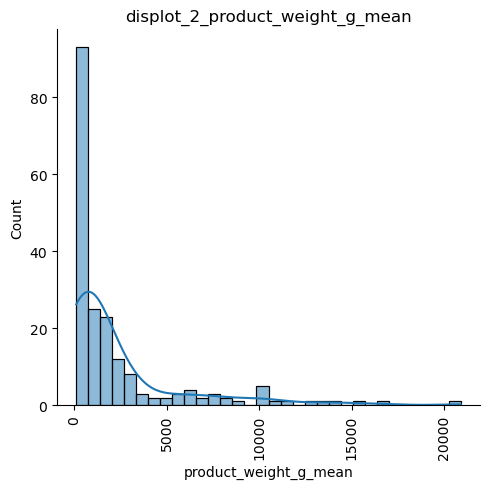

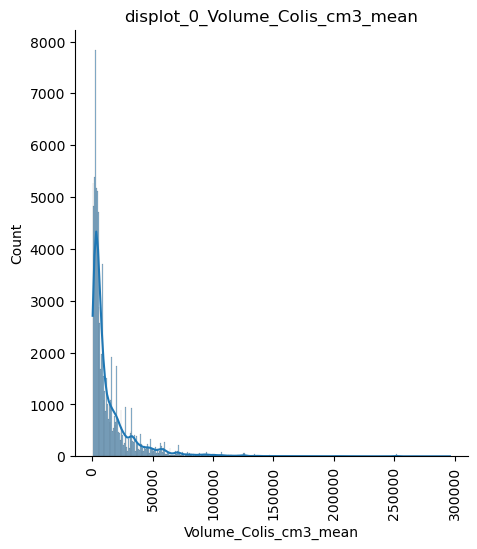

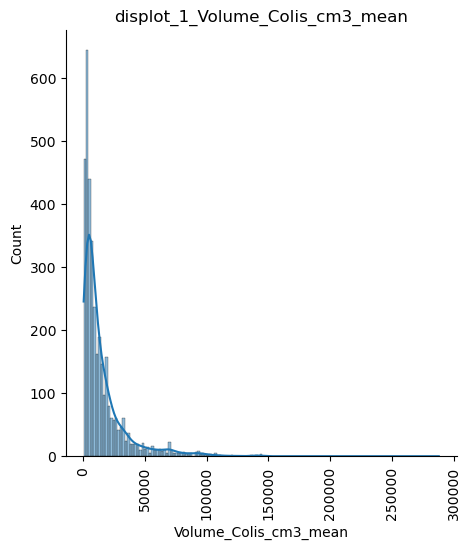

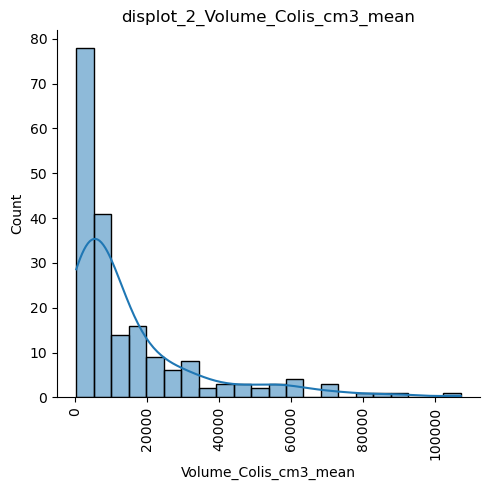

In [134]:
# Analyse des distributions
for col_variable in col_data_list :
    displot_analyse_clusters(df_ncmde_art,"ncmde_art",col_variable,[0,1,2])

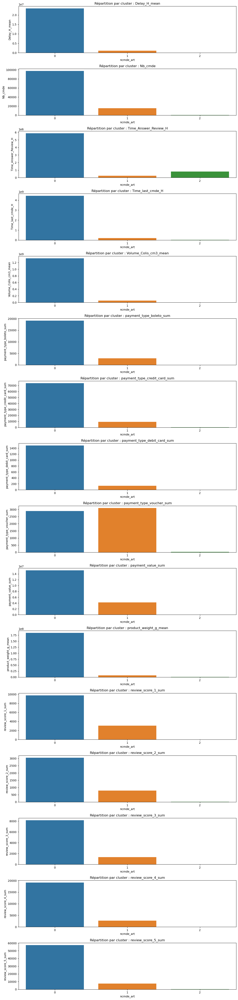

In [135]:
# Barplot de répartition dans les clusters
graph_repartition_variables_clusters(df_ncmde_art,"ncmde_art")

#### II.2.4.3) Modèle : Nb_cmde , Volume_Colis_cm3_mean

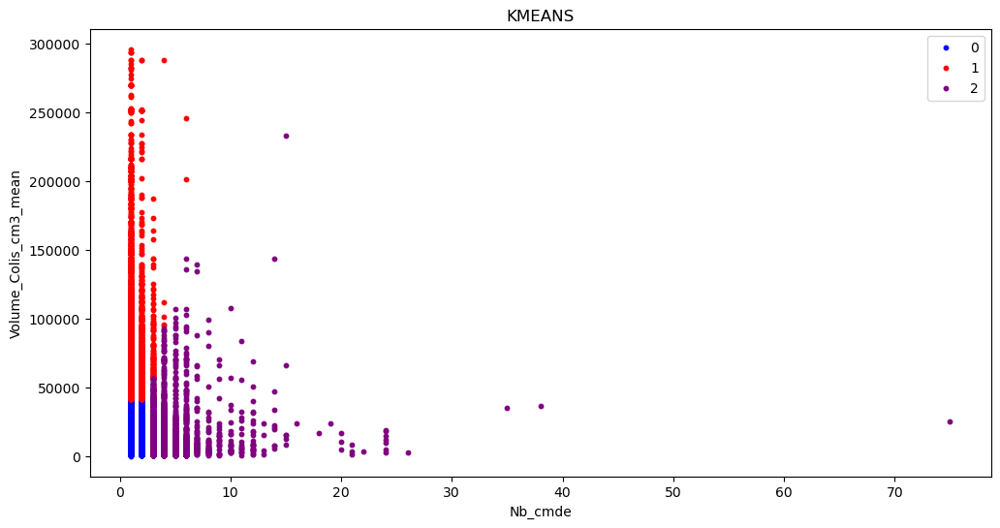

In [136]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2]
color_list = ["blue","red","purple","yellow","black","cyan","green"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df[df["ncmde_vol"]== k]
    plt.scatter(x = df_filter["Nb_cmde"], y = df_filter['Volume_Colis_cm3_mean'], color = color, label = k, s = 10)
plt.legend()
plt.title("KMEANS")
plt.xlabel("Nb_cmde")
plt.ylabel("Volume_Colis_cm3_mean")
plt.show()

In [137]:
# filtre sur le cluster pour dataframe
df_ncmde_vol = df[['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean','ncmde_vol']]

In [138]:
# Nb individus dans les clusters
df_ncmde_vol["ncmde_vol"].value_counts()

0    80061
1     7799
2     3612
Name: ncmde_vol, dtype: int64

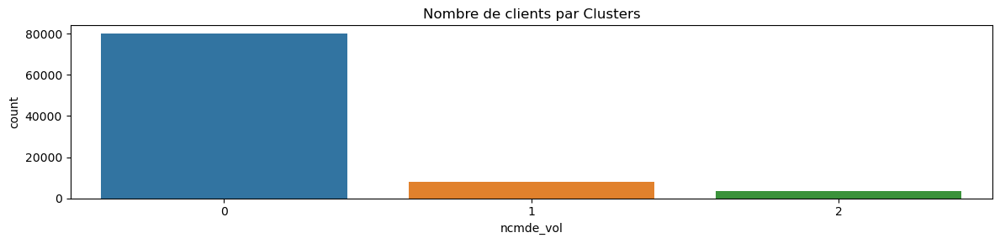

In [139]:
# Nombre de Clients par Clusters
count_plot(df_ncmde_vol,"ncmde_vol","Nombre de clients par Clusters")

In [140]:
# Moyenne des indicateurs pour chaque cluster

agreg_mean_ncmde_vol = df_ncmde_vol.groupby(by= "ncmde_vol").mean()
agreg_mean_ncmde_vol

,Nb_cmde,payment_value_sum,review_score_1_sum,review_score_2_sum,review_score_3_sum,review_score_4_sum,review_score_5_sum,payment_type_boleto_sum,payment_type_credit_card_sum,payment_type_debit_card_sum,payment_type_voucher_sum,Time_last_cmde_H,Time_Answer_Review_H,Delay_H_mean,product_weight_g_mean,Volume_Colis_cm3_mean
ncmde_vol,,,,,,,,,,,,,,,,
0,1.114862,155.432805,0.109729,0.034361,0.092417,0.218109,0.660247,0.219682,0.843894,0.017499,0.033787,50541.717481,75.461142,268.214836,1323.664500,9554.702795
1,1.133479,378.413035,0.136043,0.042698,0.105142,0.220156,0.629440,0.212463,0.877548,0.011412,0.032055,51238.355610,79.362950,260.504421,10285.804056,73889.920406
2,4.181617,1114.376561,0.834718,0.209302,0.363787,0.730066,2.043743,0.770764,2.525194,0.036545,0.849114,50619.115936,74.516683,298.059953,1751.194197,13481.104646


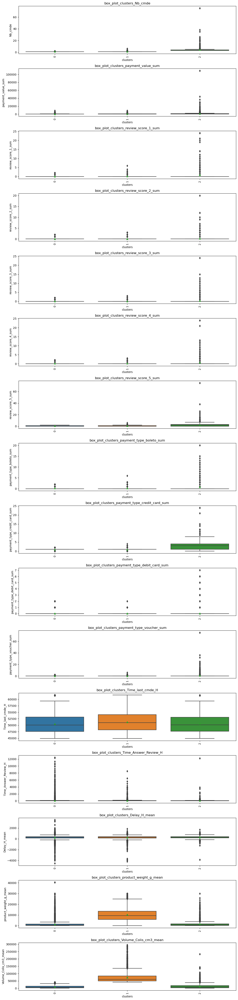

In [141]:
# Analyse box_plot
box_plot_analyse_clusters(df_ncmde_vol,'ncmde_vol',col_data_list)

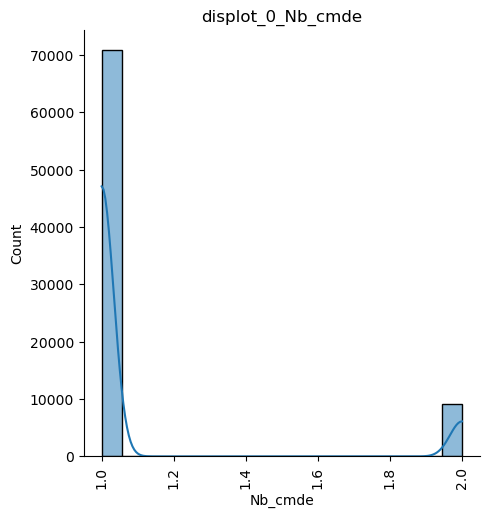

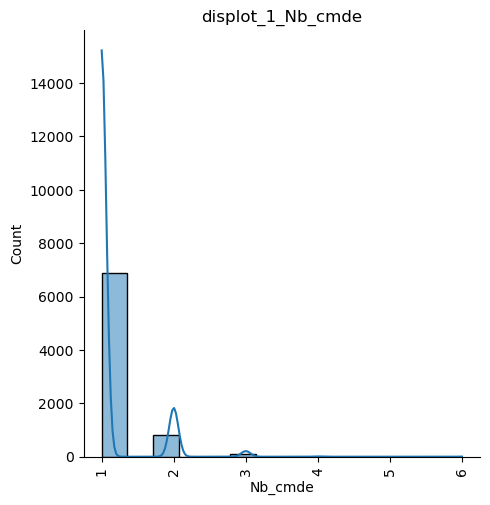

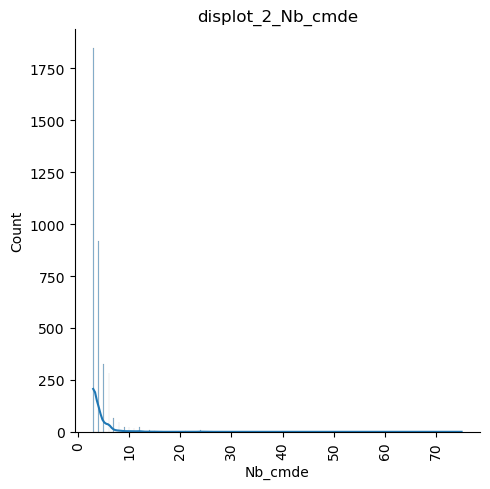

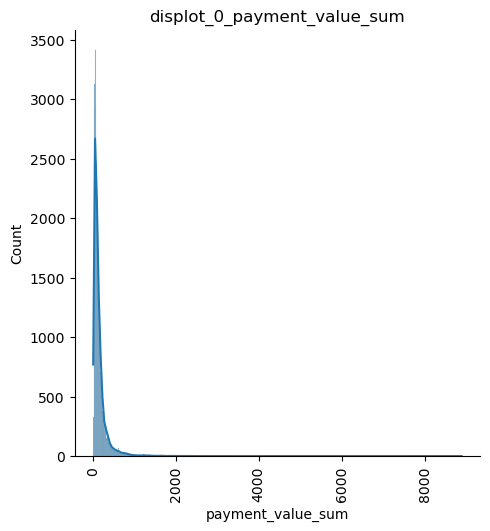

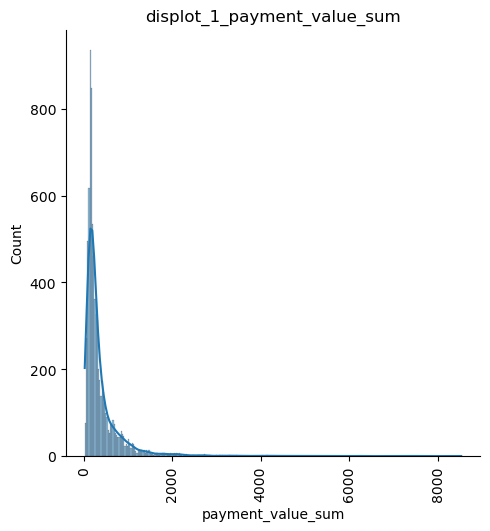

...

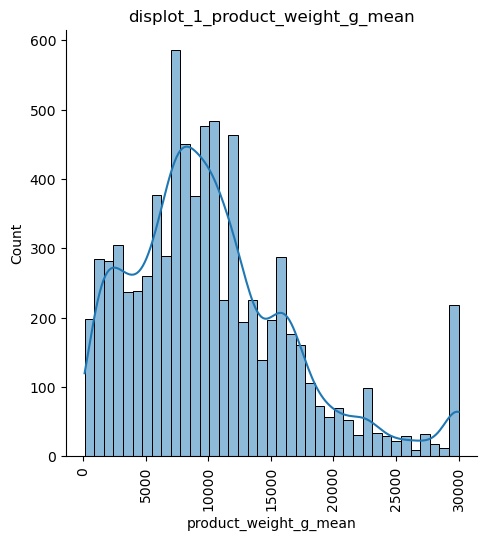

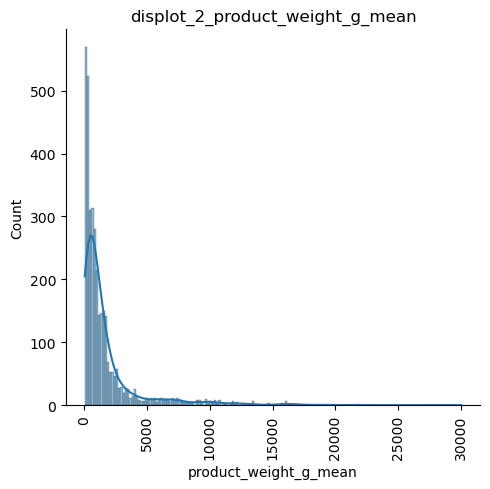

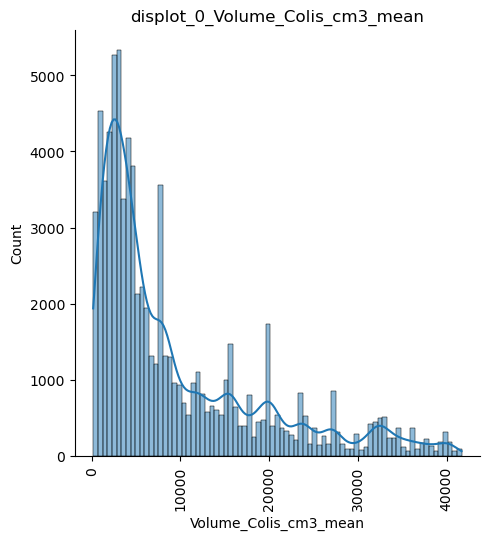

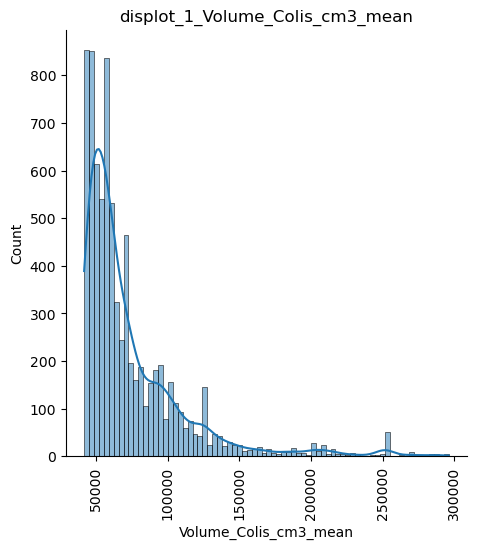

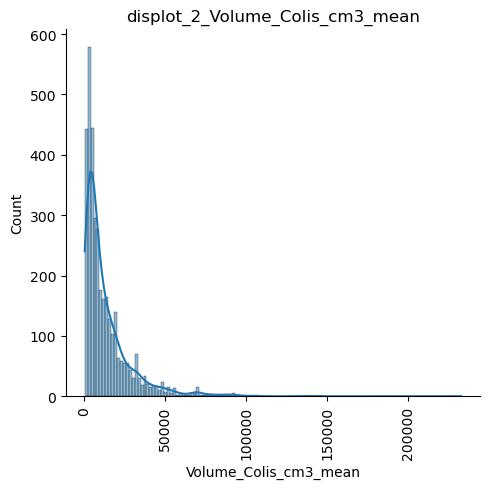

In [142]:
# Analyse des distributions
for col_variable in col_data_list :
    displot_analyse_clusters(df_ncmde_vol,"ncmde_vol",col_variable,[0,1,2])

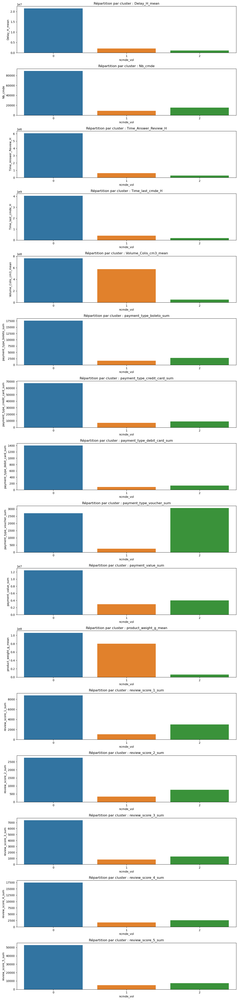

In [143]:
# Barplot de répartition dans les clusters
graph_repartition_variables_clusters(df_ncmde_vol,"ncmde_vol")

#### II.2.4.4) Modèle : pca_economie

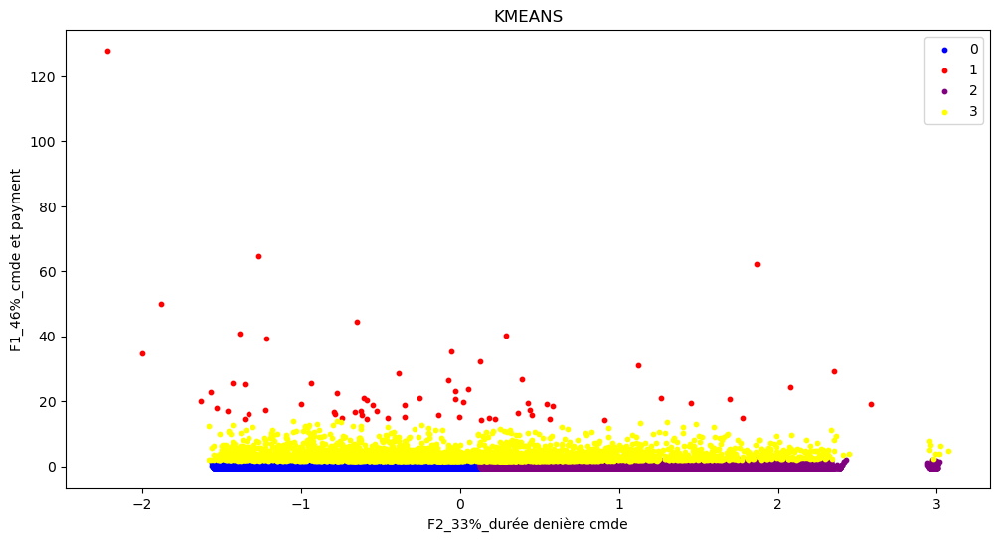

In [144]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2,3]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df_cluster_eco[df_cluster_eco["clustering_1"]== k]
    plt.scatter(x = df_filter['F2'], y = df_filter['F1'], color = color, label = k, s = 10)
plt.legend()
plt.title("KMEANS")
plt.xlabel('F2_33%_durée denière cmde')
plt.ylabel('F1_46%_cmde et payment')
plt.show()

In [145]:
# filtre sur le cluster pour dataframe
df_pca_economique = df[['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean','pca_economique']]

In [146]:
# Nb individus dans les clusters
df_pca_economique["pca_economique"].value_counts()

0    50843
2    37440
3     3123
1       66
Name: pca_economique, dtype: int64

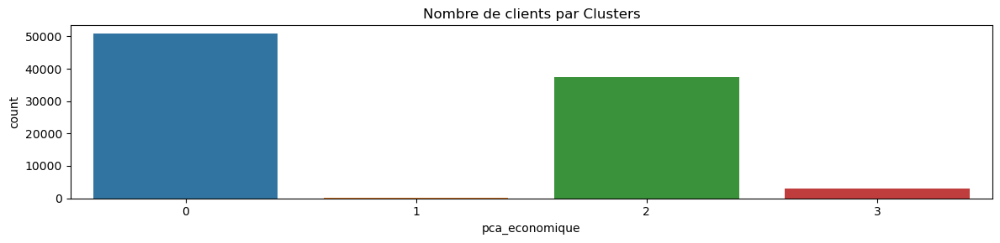

In [147]:
# Nombre de Clients par Clusters
count_plot(df_pca_economique,"pca_economique","Nombre de clients par Clusters")

In [148]:
# Moyenne des indicateurs pour chaque cluster

agreg_mean_pca_economique = df_pca_economique.groupby(by= "pca_economique").mean()
agreg_mean_pca_economique

,Nb_cmde,payment_value_sum,review_score_1_sum,review_score_2_sum,review_score_3_sum,review_score_4_sum,review_score_5_sum,payment_type_boleto_sum,payment_type_credit_card_sum,payment_type_debit_card_sum,payment_type_voucher_sum,Time_last_cmde_H,Time_Answer_Review_H,Delay_H_mean,product_weight_g_mean,Volume_Colis_cm3_mean
pca_economique,,,,,,,,,,,,,,,,
0,1.129811,164.694358,0.118600,0.035049,0.092205,0.215821,0.668135,0.211062,0.860040,0.022166,0.036544,47960.605569,70.053079,258.386111,1975.806786,13896.908501
1,14.606061,12308.768182,4.696970,0.772727,1.393939,2.469697,5.272727,3.136364,5.651515,0.000000,5.818182,50445.948788,78.130455,278.690606,4376.185303,28086.768939
2,1.134054,164.981740,0.105502,0.036378,0.098584,0.228579,0.665011,0.234028,0.845540,0.010283,0.044204,54196.874032,83.819631,280.570217,2185.110319,16376.039101
3,3.949728,1299.272149,0.823247,0.206532,0.340058,0.679475,1.900416,0.745757,2.488313,0.035223,0.680435,50574.178719,71.895011,295.147928,3190.169635,21897.902696


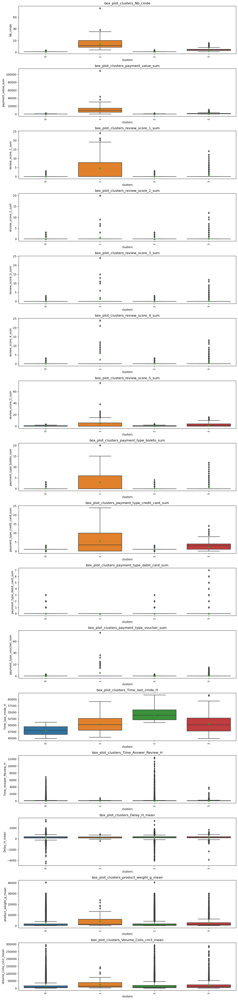

In [149]:
# Analyse box_plot
box_plot_analyse_clusters(df_pca_economique,'pca_economique',col_data_list)

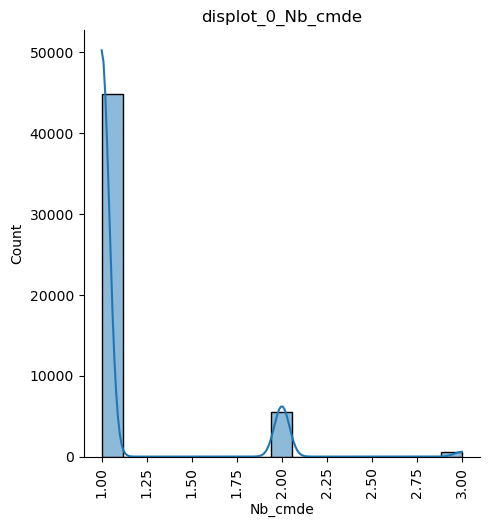

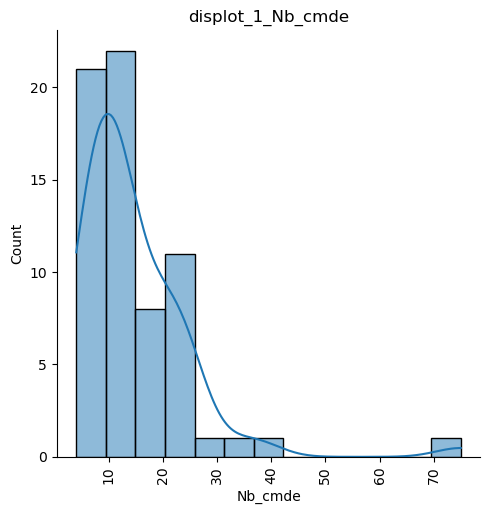

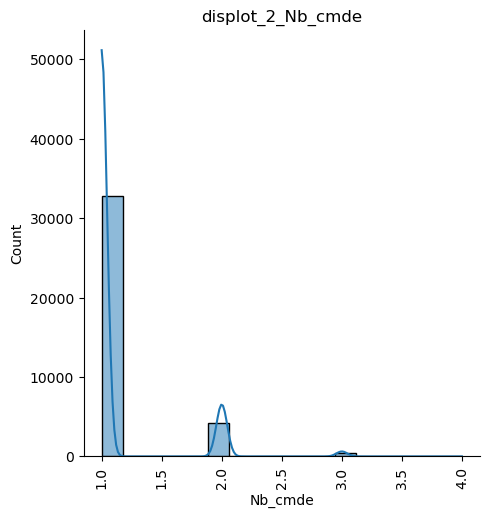

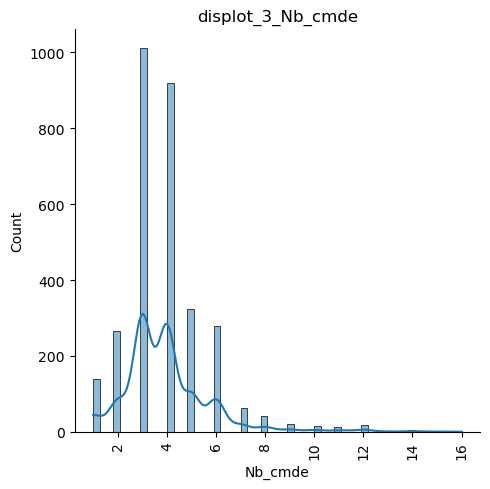

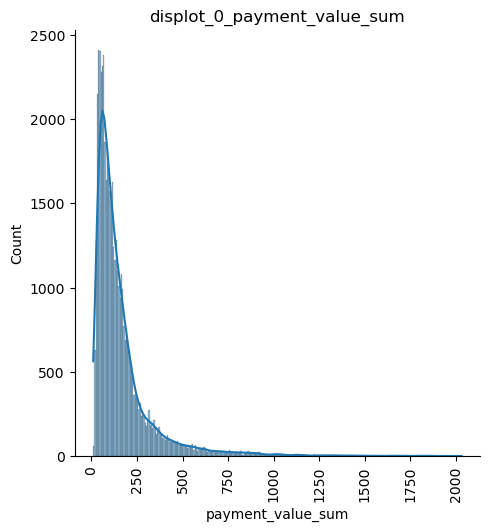

...

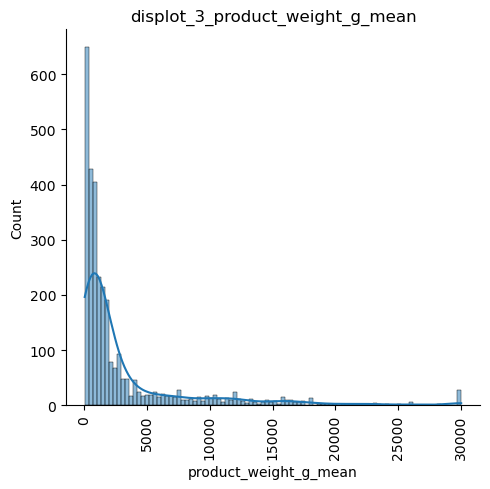

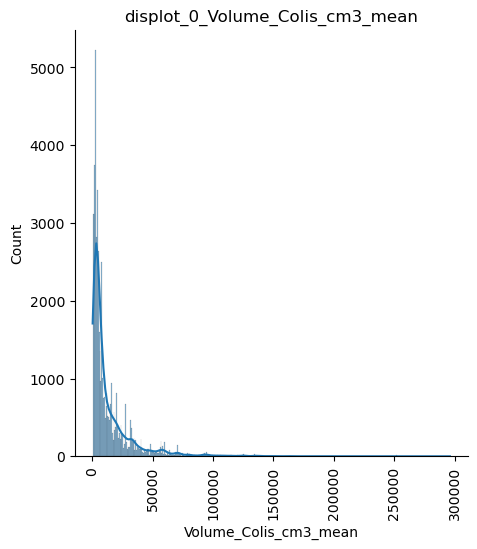

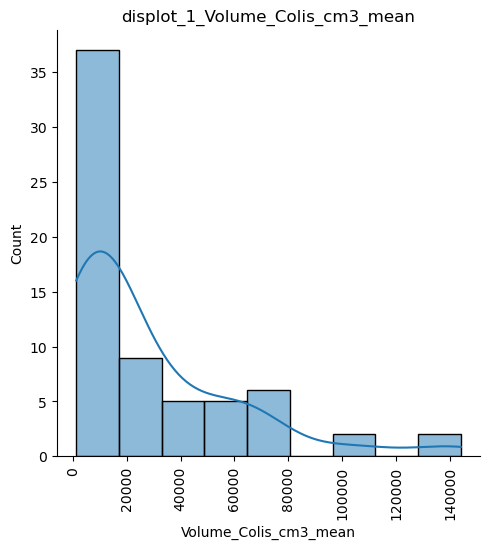

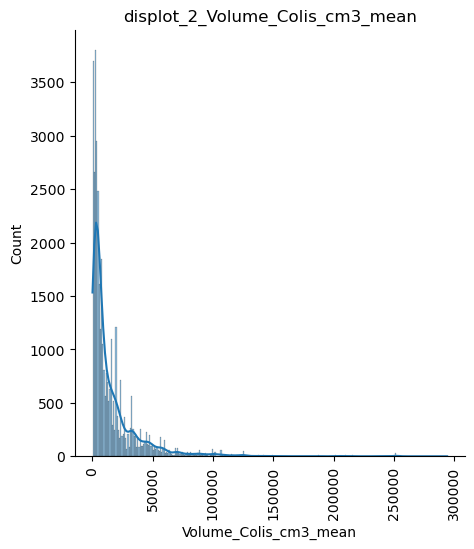

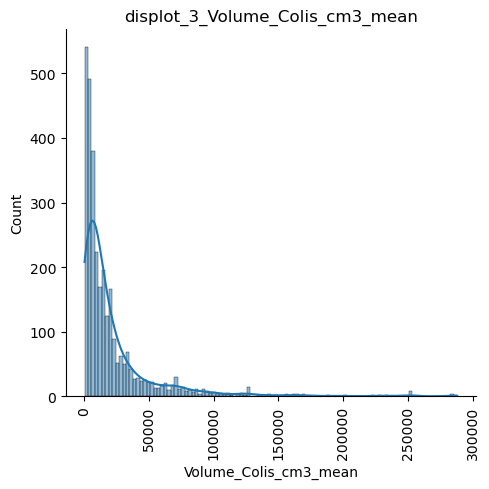

In [150]:
# Analyse des distributions
for col_variable in col_data_list :
    displot_analyse_clusters(df_pca_economique,"pca_economique",col_variable,[0,1,2,3])

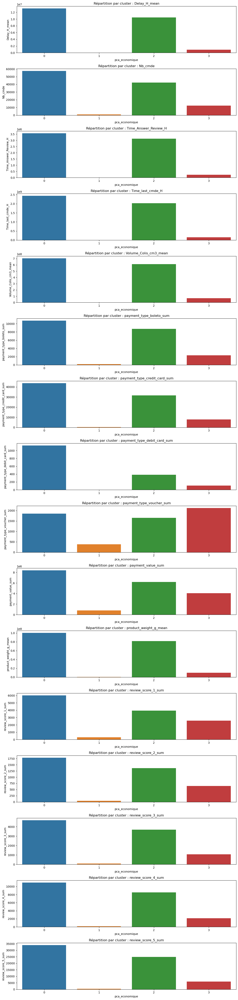

In [151]:
# Barplot de répartition dans les clusters
graph_repartition_variables_clusters(df_pca_economique,"pca_economique")

#### II.2.4.5) Modèle : pca_satisfaction

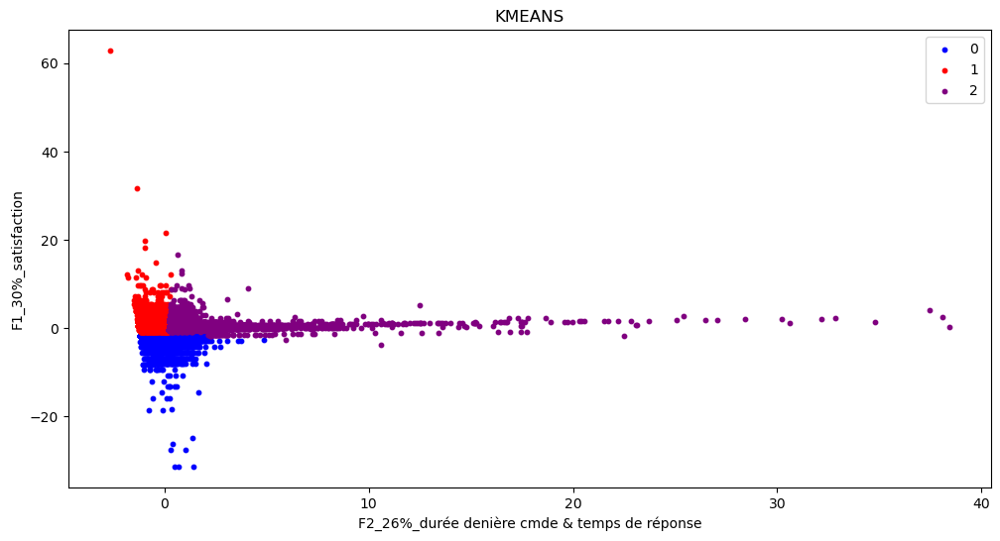

In [152]:

# Nuage de points

plt.rcParams["figure.figsize"] = [12,6]

cluster_list = [0,1,2]
color_list = ["blue","red","purple","yellow","black"]
for k,color in zip(cluster_list, color_list) :
    df_filter = df_cluster_satisfaction[df_cluster_satisfaction["clustering_1"]== k]
    plt.scatter(x = df_filter['F2'], y = df_filter['F1'], color = color, label = k, s = 10)
plt.legend()
plt.title("KMEANS")
plt.xlabel("F2_26%_durée denière cmde & temps de réponse")
plt.ylabel('F1_30%_satisfaction')
plt.show()

In [153]:
# filtre sur le cluster pour dataframe
df_pca_satisfaction = df[['Nb_cmde', 'payment_value_sum', 'review_score_1_sum',
       'review_score_2_sum', 'review_score_3_sum', 'review_score_4_sum',
       'review_score_5_sum', 'payment_type_boleto_sum',
       'payment_type_credit_card_sum', 'payment_type_debit_card_sum',
       'payment_type_voucher_sum', 'Time_last_cmde_H', 'Time_Answer_Review_H',
       'Delay_H_mean', 'product_weight_g_mean', 'Volume_Colis_cm3_mean','pca_satisfaction']]

In [154]:
# Nb individus dans les clusters
df_pca_satisfaction["pca_satisfaction"].value_counts()

1    54227
2    28373
0     8872
Name: pca_satisfaction, dtype: int64

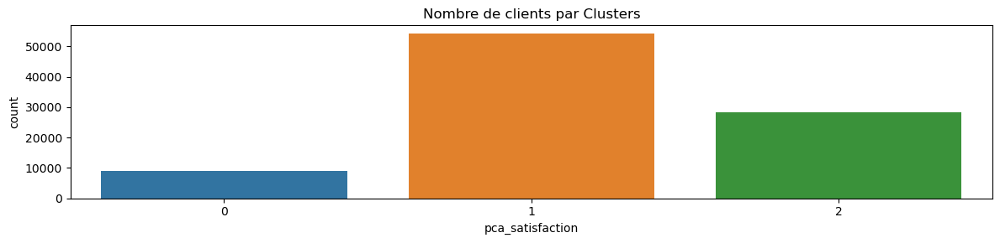

In [155]:
# Nombre de Clients par Clusters
count_plot(df_pca_satisfaction,"pca_satisfaction","Nombre de clients par Clusters")

In [156]:
# Moyenne des indicateurs pour chaque cluster

agreg_mean_pca_satisfaction = df_pca_satisfaction.groupby(by= "pca_satisfaction").mean()
agreg_mean_pca_satisfaction

,Nb_cmde,payment_value_sum,review_score_1_sum,review_score_2_sum,review_score_3_sum,review_score_4_sum,review_score_5_sum,payment_type_boleto_sum,payment_type_credit_card_sum,payment_type_debit_card_sum,payment_type_voucher_sum,Time_last_cmde_H,Time_Answer_Review_H,Delay_H_mean,product_weight_g_mean,Volume_Colis_cm3_mean
pca_satisfaction,,,,,,,,,,,,,,,,
0,1.462015,345.303207,1.424482,0.005861,0.008904,0.013413,0.009355,0.287083,1.079914,0.016118,0.078900,50496.060466,60.138913,78.713332,2366.149999,16682.740552
1,1.218305,198.301004,0.002121,0.045457,0.111457,0.252218,0.807052,0.227912,0.906246,0.021594,0.062552,48461.496658,53.220390,276.782985,1984.760093,14111.879808
2,1.204138,197.500392,0.003806,0.046629,0.120185,0.282663,0.750855,0.251049,0.874211,0.010855,0.068022,54733.091239,123.711482,312.774783,2252.075368,16799.990103


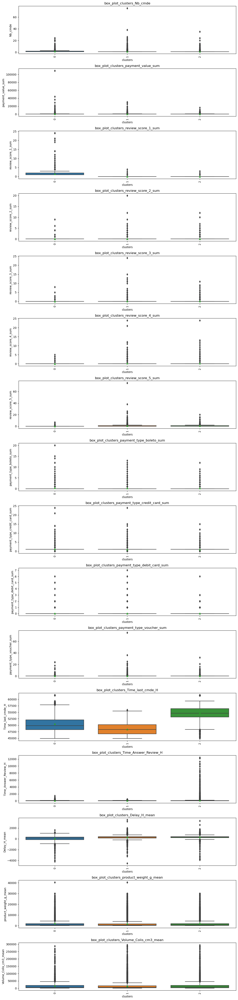

In [157]:
# Analyse box_plot
box_plot_analyse_clusters(df_pca_satisfaction,'pca_satisfaction',col_data_list)

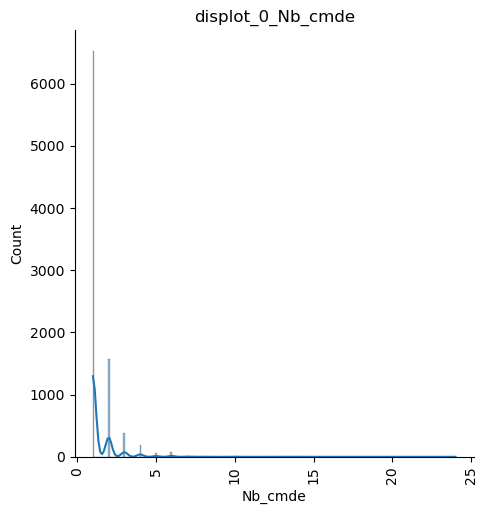

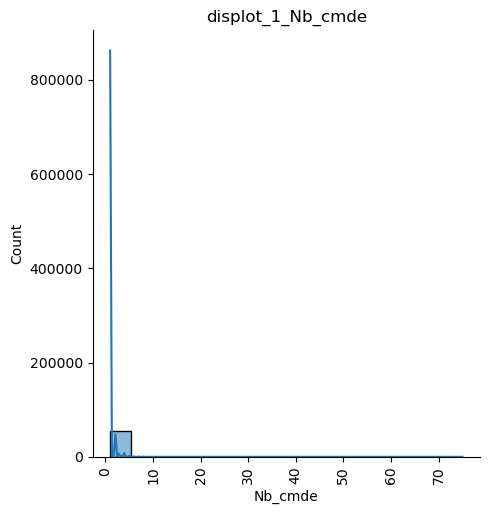

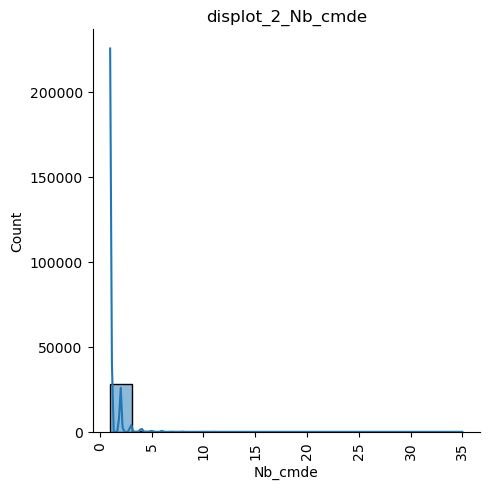

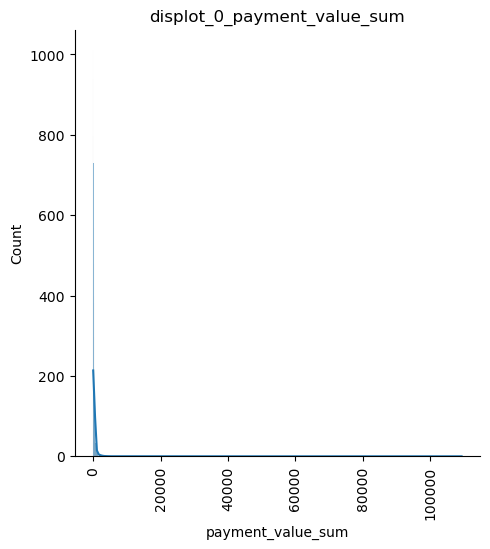

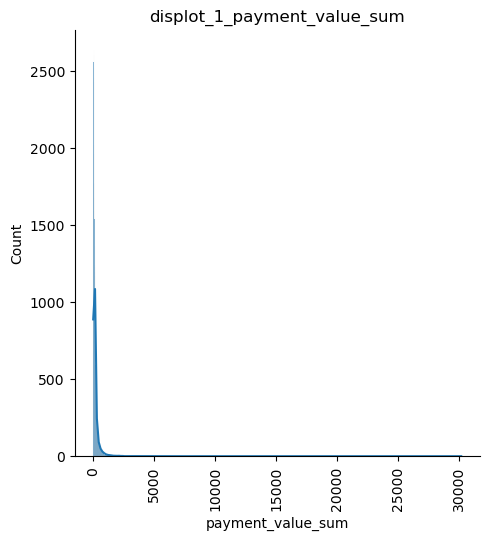

...

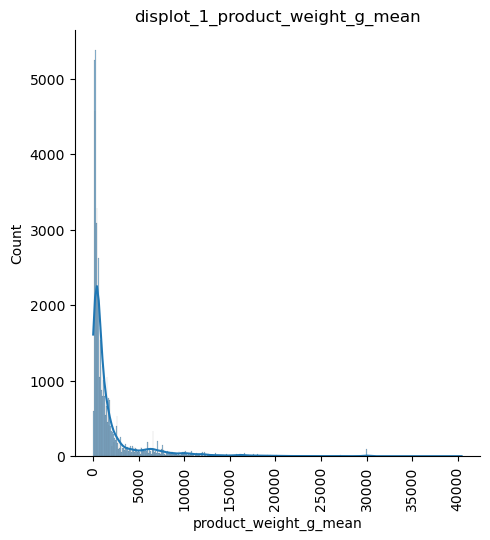

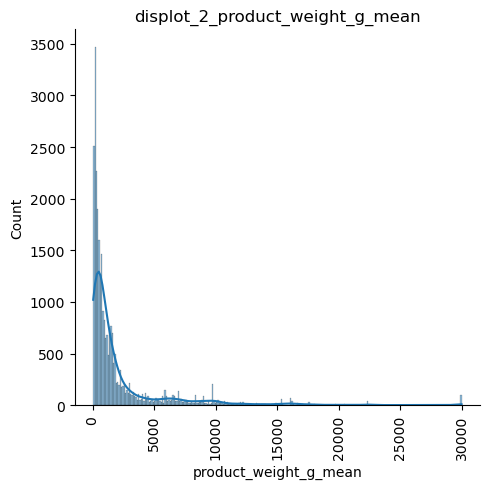

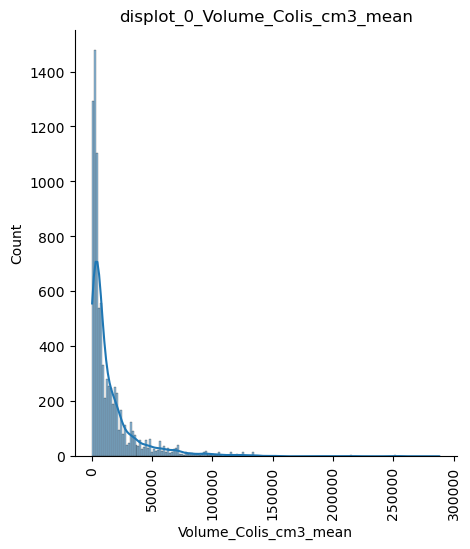

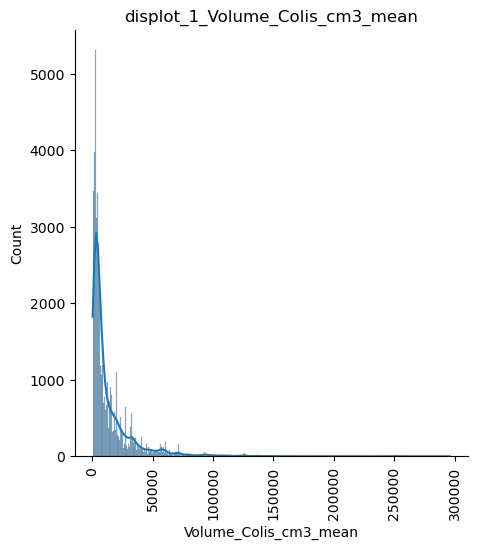

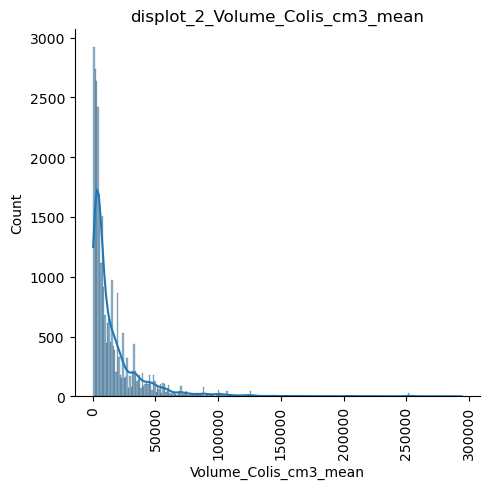

In [158]:
# Analyse des distributions
for col_variable in col_data_list :
    displot_analyse_clusters(df_pca_satisfaction,"pca_satisfaction",col_variable,[0,1,2])

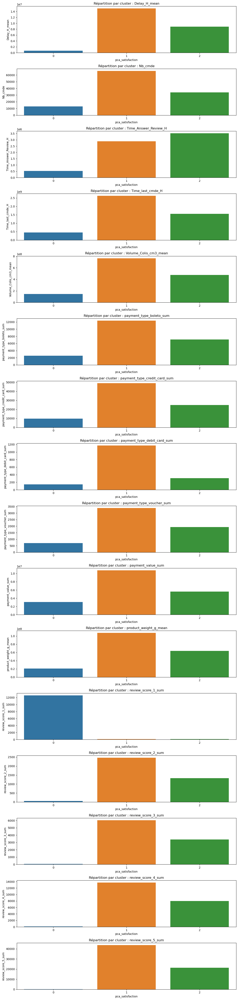

In [159]:
# Barplot de répartition dans les clusters
graph_repartition_variables_clusters(df_pca_satisfaction,"pca_satisfaction")

## II.3) DBSCAN

In [160]:
from sklearn import metrics
from sklearn.cluster import DBSCAN

In [161]:
# Cluster pca_eco (4 clusters)
X_cluster_pca_eco = df_cluster_eco[['F1', 'F2']]
## Pas de convergence avec la totalité des Clients !!!!!

In [162]:
# Cluster pca_eco (3 clusters)
X_Ncmde_Pays = df[['Nb_cmde', 'payment_value_sum']]

In [163]:
def dbscan_test(X, eps_max, samples_min) :
    eps_ = np.arange(0.1,eps_max,0.1)
    dico_cluster = {}
    dico_noise = {}
    for EPS in eps_:
        db = DBSCAN(eps = EPS, min_samples = samples_min).fit(X_Ncmde_Pays)
        labels = db.labels_
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise_ = list(labels).count(-1)
        dico_cluster[EPS]= n_clusters_
        dico_noise[EPS] = n_noise_
    df_clusters_count = pd.DataFrame.from_dict(dico_cluster, orient = 'index', columns = ['nb_cluster'])
    df_noise_count = pd.DataFrame.from_dict(dico_noise, orient = 'index', columns = ['nb_client_noise'])
    plt.rcParams['figure.figsize'] = [12,10]
    plt.subplot(2,1,1)
    plt.plot(df_clusters_count)
    plt.title("nb_clusters")
    plt.subplot(2,1,2)
    plt.plot(df_noise_count, color = "r")
    plt.title("nb_clients_noise_")
    plt.tight_layout()
    plt.show()

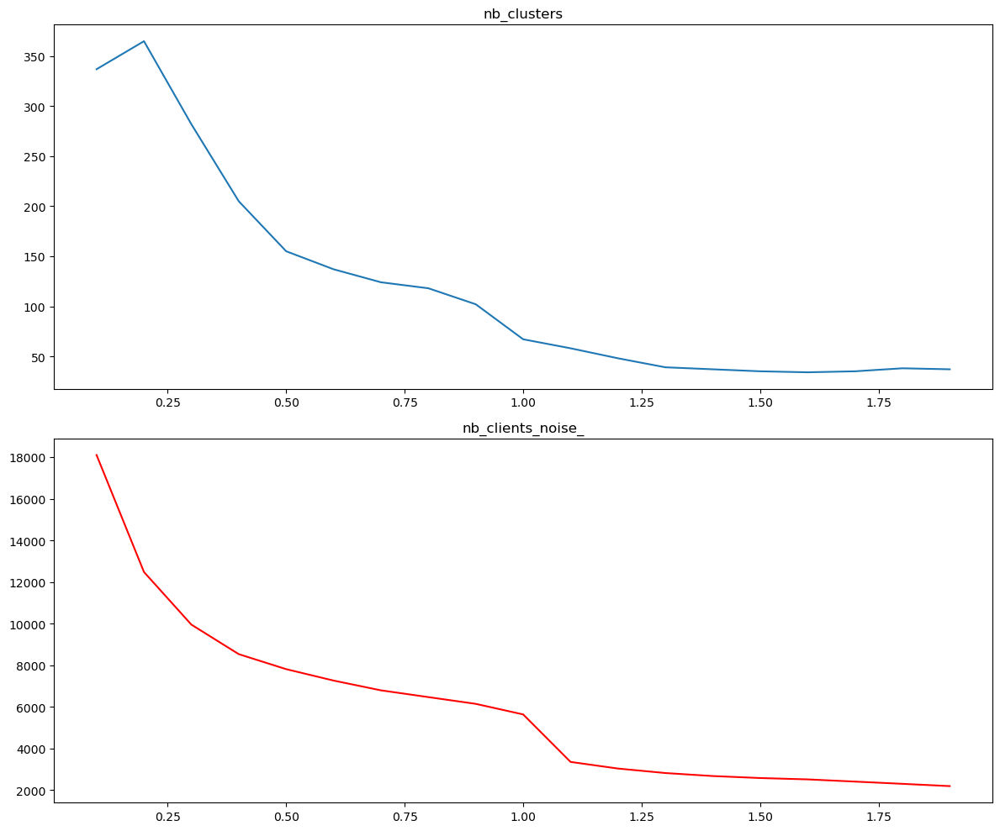

In [231]:
# Test DBSCAN
dbscan_test(X_Ncmde_Pays,2,10)

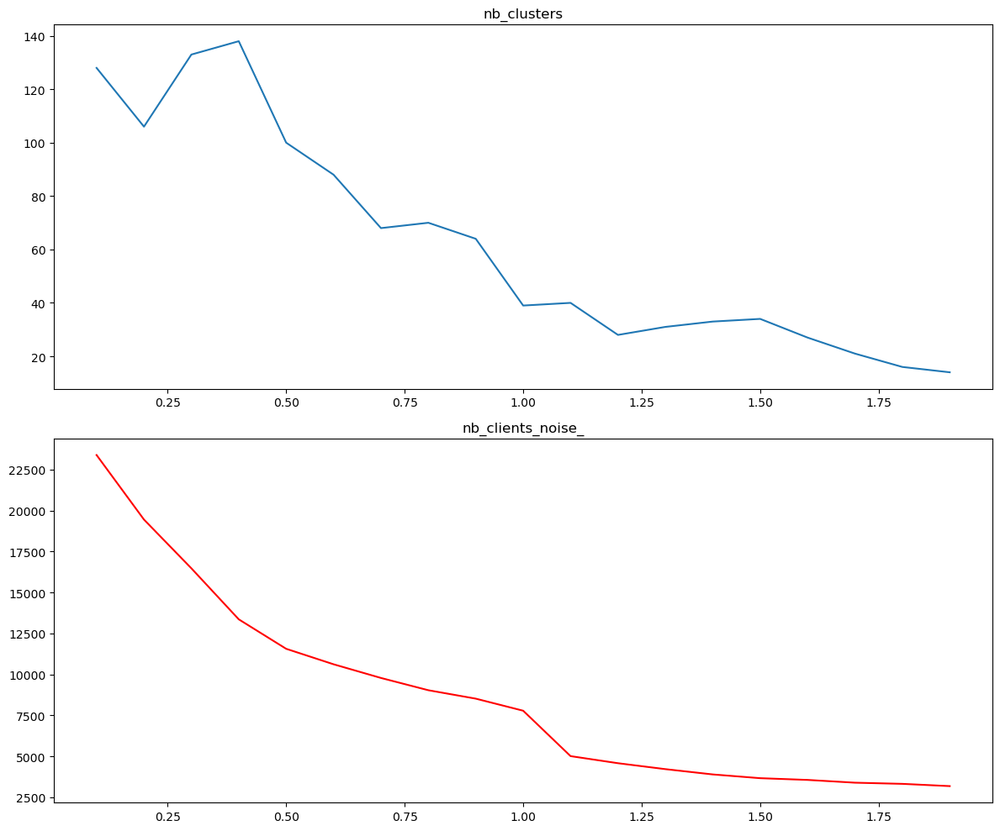

In [232]:
# Test DBSCAN
dbscan_test(X_Ncmde_Pays,2,20)

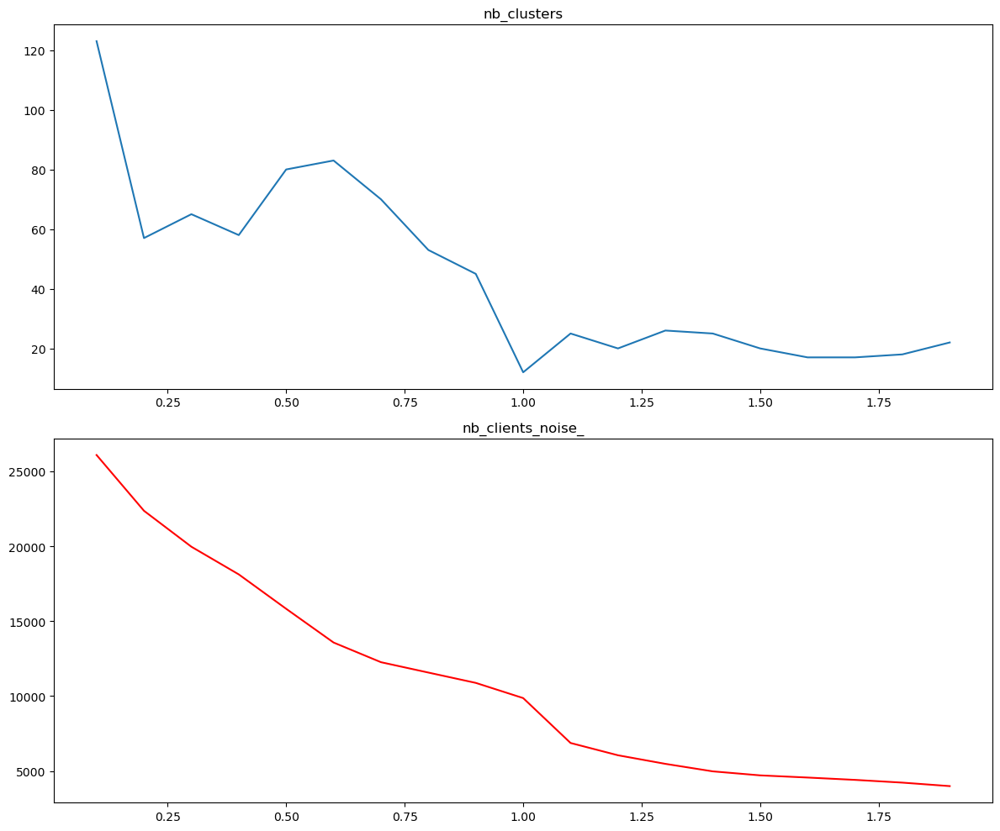

In [233]:
# Test DBSCAN
dbscan_test(X_Ncmde_Pays,2,30)

## II.3) Hierarchical clustering

In [164]:
# importation des metrics et outils de clustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score, silhouette_samples

In [165]:
# matrice de similarité
linkage_matrix = linkage(X_Ncmde_Pays, method = 'ward', metric = 'euclidean')
linkage_matrix

MemoryError: Unable to allocate 31.2 GiB for an array with shape (4183517656,) and data type float64

In [166]:
# matrice de similarité !! pour 10000 Clients sinon bug
linkage_matrix = linkage(X_Ncmde_Pays[0:10000], method = 'ward', metric = 'euclidean')
linkage_matrix

array([[1.00000000e+00, 2.03800000e+03, 0.00000000e+00, 2.00000000e+00],
       [2.00000000e+00, 9.14800000e+03, 0.00000000e+00, 2.00000000e+00],
       [3.00000000e+00, 4.20100000e+03, 0.00000000e+00, 2.00000000e+00],
       ...,
       [1.99930000e+04, 1.99940000e+04, 3.93644664e+04, 2.09000000e+02],
       [1.99950000e+04, 1.99960000e+04, 4.73893844e+04, 9.99900000e+03],
       [3.65600000e+03, 1.99970000e+04, 1.54280852e+05, 1.00000000e+04]])

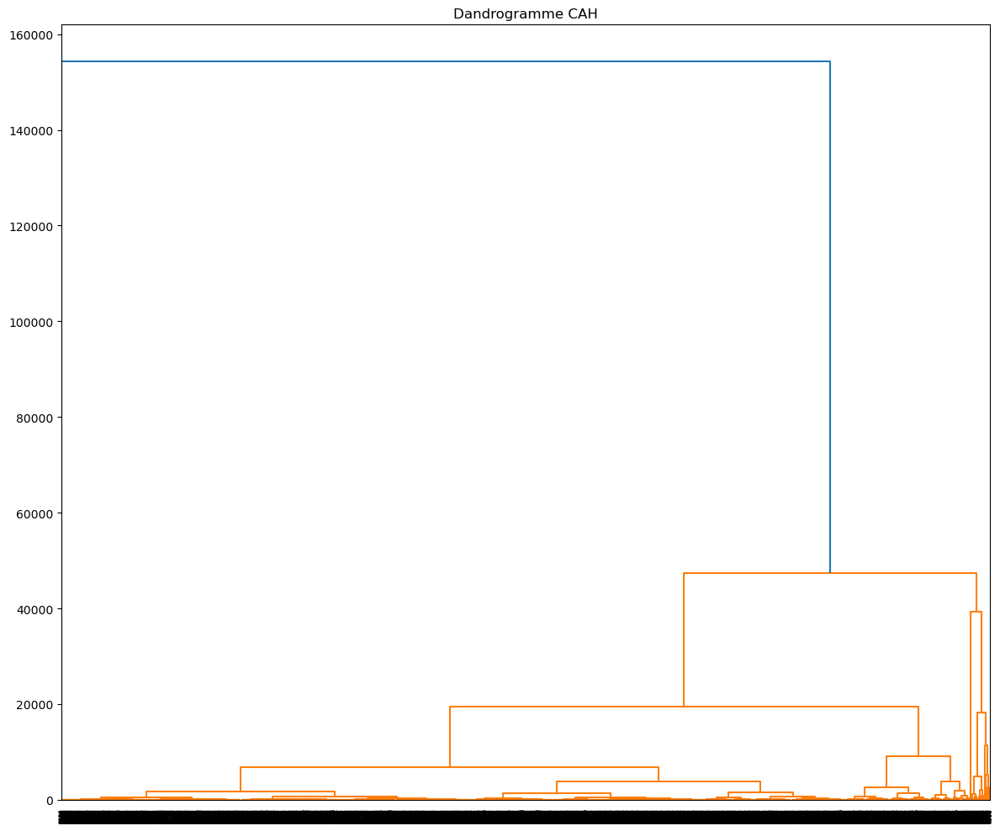

In [167]:
# Affichage dendogramme partiel
plt.rcParams['figure.figsize'] = [12,10]
dendrogram(linkage_matrix)
plt.title("Dandrogramme CAH")
plt.tight_layout()
plt.show()